1. Importing Neceesary Libraries

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA


2. Importing the Datasets

In [ ]:
spotify_df = pd.read_csv('spotify_tracks.csv')
df=pd.read_csv('spotify_data_description.csv')


3.Data Cleaning and Preprocessing

In [ ]:
# Replace exact "Unknown" with NaN and drop all rows containing any NaN values
spotify_df = spotify_df.replace("Unknown", pd.NA).dropna(how="any")


4.Initial Analysis Of The Datase

In [ ]:
# Detailed shape summary in table-like style
rows, columns = spotify_df.shape
print("------ Dataset Dimension Summary ------")
print(f"Total Rows     : {rows}")
print(f"Total Columns  : {columns}")
print("--------------------------------------")


------ Dataset Dimension Summary ------
Total Rows     : 49312
Total Columns  : 22
--------------------------------------


In [ ]:
# ===== Organized spotify_df.info() Summary in Table Format =====

import pandas as pd

info_table = pd.DataFrame({
    'Column Name': spotify_df.columns,
    'Non-Null Count': spotify_df.notnull().sum().values,
    'Null Count': spotify_df.isnull().sum().values,
    'Data Type': spotify_df.dtypes.values
})

# Add Percentage of Missing Data
info_table['Missing %'] = (info_table['Null Count'] / len(spotify_df) * 100).round(2)

# Display as a nicely formatted table
print("\n📊 Spotify Dataset Information Overview:\n")
print(info_table.to_string(index=False))



📊 Spotify Dataset Information Overview:

     Column Name  Non-Null Count  Null Count Data Type  Missing %
        track_id           49312           0    object        0.0
      track_name           49312           0    object        0.0
     artist_name           49312           0    object        0.0
            year           49312           0     int64        0.0
      popularity           49312           0     int64        0.0
     artwork_url           49312           0    object        0.0
      album_name           49312           0    object        0.0
    acousticness           49312           0   float64        0.0
    danceability           49312           0   float64        0.0
     duration_ms           49312           0   float64        0.0
          energy           49312           0   float64        0.0
instrumentalness           49312           0   float64        0.0
             key           49312           0   float64        0.0
        liveness           49312  

In [ ]:
import pandas as pd

# Load Dataset
spotify_df = pd.read_csv('spotify_tracks.csv')

# Basic view of dataset
print("Dataset Shape:", spotify_df.shape)
print("\nDuplicate Rows:", spotify_df.duplicated().sum())
print("\nMissing Values per Column:")
print(spotify_df.isnull().sum())

print("\nUnique Languages:", spotify_df['language'].nunique())
print("Languages Sample:", spotify_df['language'].unique()[:10])

# Better Head View
print("\nTop 10 Rows Preview:")
display(spotify_df.head(10))

# Numeric summary of first 10 rows only (quick feel for values)
print("\nDescriptive Stats for First 10 Samples (Numeric Features Only):")
display(spotify_df.head(10).describe())


Dataset Shape: (62317, 22)

Duplicate Rows: 78

Missing Values per Column:
track_id            0
track_name          0
artist_name         0
year                0
popularity          0
artwork_url         0
album_name          0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
speechiness         0
tempo               0
time_signature      0
valence             0
track_url           0
language            0
dtype: int64

Unique Languages: 7
Languages Sample: ['Tamil' 'Telugu' 'English' 'Hindi' 'Malayalam' 'Unknown' 'Korean']

Top 10 Rows Preview:


,track_id,track_name,artist_name,year,popularity,artwork_url,album_name,acousticness,danceability,duration_ms,...,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,track_url,language
0,2r0ROhr7pRN4MXDMT1fEmd,"Leo Das Entry (From ""Leo"")",Anirudh Ravichander,2024,59,https://i.scdn.co/image/ab67616d0000b273ce9c65...,"Leo Das Entry (From ""Leo"")",0.0241,0.753,97297.0,...,8.0,0.1000,-5.994,0.0,0.1030,110.997,4.0,0.459,https://open.spotify.com/track/2r0ROhr7pRN4MXD...,Tamil
1,4I38e6Dg52a2o2a8i5Q5PW,AAO KILLELLE,"Anirudh Ravichander, Pravin Mani, Vaishali Sri...",2024,47,https://i.scdn.co/image/ab67616d0000b273be1b03...,AAO KILLELLE,0.0851,0.780,207369.0,...,10.0,0.0951,-5.674,0.0,0.0952,164.995,3.0,0.821,https://open.spotify.com/track/4I38e6Dg52a2o2a...,Tamil
2,59NoiRhnom3lTeRFaBzOev,Mayakiriye Sirikiriye - Orchestral EDM,"Anirudh Ravichander, Anivee, Alvin Bruno",2024,35,https://i.scdn.co/image/ab67616d0000b27334a1dd...,Mayakiriye Sirikiriye (Orchestral EDM),0.0311,0.457,82551.0,...,2.0,0.0831,-8.937,0.0,0.1530,169.996,4.0,0.598,https://open.spotify.com/track/59NoiRhnom3lTeR...,Tamil
3,5uUqRQd385pvLxC8JX3tXn,Scene Ah Scene Ah - Experimental EDM Mix,"Anirudh Ravichander, Bharath Sankar, Kabilan, ...",2024,24,https://i.scdn.co/image/ab67616d0000b27332e623...,Scene Ah Scene Ah (Experimental EDM Mix),0.2270,0.718,115831.0,...,7.0,0.1240,-11.104,1.0,0.4450,169.996,4.0,0.362,https://open.spotify.com/track/5uUqRQd385pvLxC...,Tamil
4,1KaBRg2xgNeCljmyxBH1mo,Gundellonaa X I Am A Disco Dancer - Mashup,"Anirudh Ravichander, Benny Dayal, Leon James, ...",2024,22,https://i.scdn.co/image/ab67616d0000b2735a59b6...,Gundellonaa X I Am a Disco Dancer (Mashup),0.0153,0.689,129621.0,...,7.0,0.3450,-9.637,1.0,0.1580,128.961,4.0,0.593,https://open.spotify.com/track/1KaBRg2xgNeCljm...,Tamil
5,1vpppvz6ihHvKFIaUBy2zf,"Villain Yevadu Ra (From ""Leo (Telugu)"")","Anirudh Ravichander, Manisha Eerabathini, Samp...",2024,26,https://i.scdn.co/image/ab67616d0000b27377144f...,"Villain Yevadu Ra [From ""Leo (Telugu)""]",0.1990,0.699,185802.0,...,7.0,0.2150,-8.139,0.0,0.0395,106.048,4.0,0.411,https://open.spotify.com/track/1vpppvz6ihHvKFI...,Telugu
6,6FSIepMOKFf9p4KVQ24676,Gundellonaa - Pop Kuthu,"Anirudh Ravichander, Leon James, Kasarla Shyam...",2024,18,https://i.scdn.co/image/ab67616d0000b2736a5734...,Gundellonaa (Pop Kuthu),0.0850,0.559,74579.0,...,9.0,0.1780,-9.585,0.0,0.0802,132.038,4.0,0.518,https://open.spotify.com/track/6FSIepMOKFf9p4K...,Tamil
7,63tA4cYTJATGSqTE0O8Vp4,Knockout Song - Funk Mix,"Anirudh Ravichander, Madley Blues, Vignesh Shi...",2024,18,https://i.scdn.co/image/ab67616d0000b2732d6b57...,Knockout Song (Funk Mix),0.1190,0.801,87089.0,...,4.0,0.1320,-5.771,0.0,0.2590,119.971,4.0,0.821,https://open.spotify.com/track/63tA4cYTJATGSqT...,English
8,3OSveGXWccyTLleBeJ2OKq,Rathamaarey (LoFi Version),"Anirudh Ravichander, Vishal Mishra, Vignesh Sh...",2024,34,https://i.scdn.co/image/ab67616d0000b27368528a...,Rathamaarey (LoFi Version),0.3620,0.500,262785.0,...,4.0,0.2990,-9.402,1.0,0.0444,158.191,4.0,0.119,https://open.spotify.com/track/3OSveGXWccyTLle...,Tamil
9,0FEViAIJ0oQuLXTHMAGdEK,Theeraamal - Ambient Mix,"Anirudh Ravichander, Ramjeevan, Karthik Netha,...",2024,17,https://i.scdn.co/image/ab67616d0000b273d89c56...,Theeraamal (Ambient Mix),0.6460,0.619,91746.0,...,1.0,0.1140,-9.901,1.0,0.0428,126.101,4.0,0.136,https://open.spotify.com/track/0FEViAIJ0oQuLXT...,Tamil



Descriptive Stats for First 10 Samples (Numeric Features Only):


,year,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
count,10.0,10.000000,10.000000,10.000000,10.000000,10.00000,1.000000e+01,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000,10.000000
mean,2024.0,30.000000,0.179360,0.657500,133467.000000,0.63960,4.809418e-02,5.900000,0.168520,-8.414400,0.400000,0.142010,138.729400,3.900000,0.483800
std,0.0,13.920409,0.196695,0.118923,63691.520794,0.17496,1.147259e-01,2.998148,0.090732,1.943336,0.516398,0.126174,24.748842,0.316228,0.242289
min,2024.0,17.000000,0.015300,0.457000,74579.000000,0.46700,0.000000e+00,1.000000,0.083100,-11.104000,0.000000,0.039500,106.048000,3.000000,0.119000
25%,2024.0,19.000000,0.044575,0.574000,88253.250000,0.49425,3.375000e-07,4.000000,0.103500,-9.624000,0.000000,0.053350,121.503500,4.000000,0.374250
50%,2024.0,25.000000,0.102050,0.694000,106564.000000,0.57400,3.702500e-04,7.000000,0.128000,-9.169500,0.000000,0.099100,130.499500,4.000000,0.488500
75%,2024.0,34.750000,0.220000,0.744250,171756.750000,0.77875,3.137500e-02,7.750000,0.205750,-6.530250,1.000000,0.156750,163.294000,4.000000,0.596750
max,2024.0,59.000000,0.646000,0.801000,262785.000000,0.97000,3.700000e-01,10.000000,0.345000,-5.674000,1.000000,0.445000,169.996000,4.000000,0.821000


In [ ]:
import pandas as pd


for col in spotify_df.columns:
    try:
        spotify_df[col] = pd.to_datetime(spotify_df[col], errors='raise')
    except:
        pass

# Categorize columns correctly
numerical_cols = spotify_df.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_cols = spotify_df.select_dtypes(include=['object', 'category']).columns.tolist()
temporal_cols = spotify_df.select_dtypes(include=['datetime64']).columns.tolist()

# Summary DataFrame
column_summary = pd.DataFrame({
    "Column Type": ["Numerical", "Categorical", "Temporal"],
    "Count": [len(numerical_cols), len(categorical_cols), len(temporal_cols)],
    "Percentage": [
        round(len(numerical_cols)/len(spotify_df.columns)*100, 2),
        round(len(categorical_cols)/len(spotify_df.columns)*100, 2),
        round(len(temporal_cols)/len(spotify_df.columns)*100, 2)
    ]
})

print("\n📌 COLUMN TYPE SUMMARY\n")
print(column_summary.to_string(index=False))

# Display each category in a clean table format
print("\n📊 NUMERICAL COLUMNS:\n")
print(pd.DataFrame({"Numerical Columns": numerical_cols}).to_string(index=False))

print("\n🔤 CATEGORICAL COLUMNS:\n")
print(pd.DataFrame({"Categorical Columns": categorical_cols}).to_string(index=False))

print("\n⏱️ TEMPORAL COLUMNS:\n")
print(pd.DataFrame({"Temporal Columns": temporal_cols}).to_string(index=False))




📌 COLUMN TYPE SUMMARY

Column Type  Count  Percentage
  Numerical      0        0.00
Categorical      7       31.82
   Temporal     15       68.18

📊 NUMERICAL COLUMNS:

Empty DataFrame
Columns: [Numerical Columns]
Index: []

🔤 CATEGORICAL COLUMNS:

Categorical Columns
           track_id
         track_name
        artist_name
        artwork_url
         album_name
          track_url
           language

⏱️ TEMPORAL COLUMNS:

Temporal Columns
            year
      popularity
    acousticness
    danceability
     duration_ms
          energy
instrumentalness
             key
        liveness
        loudness
            mode
     speechiness
           tempo
  time_signature
         valence


/tmp/ipython-input-404909054.py:6: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  spotify_df[col] = pd.to_datetime(spotify_df[col], errors='raise')
/tmp/ipython-input-404909054.py:6: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  spotify_df[col] = pd.to_datetime(spotify_df[col], errors='raise')
/tmp/ipython-input-404909054.py:6: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  spotify_df[col] = pd.to_datetime(spotify_df[col], errors='raise')
/tmp/ipython-input-404909054.py:6: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateu

In [ ]:
# Select only numeric columns
numeric_df = spotify_df.select_dtypes(include=[np.number])

# Compute statistics
mean_vals = numeric_df.mean()
median_vals = numeric_df.median()

# SAFE MODE: avoid IndexError
mode_df = numeric_df.mode()
if mode_df.empty:
    mode_vals = pd.Series([np.nan] * len(numeric_df.columns), index=numeric_df.columns)
else:
    mode_vals = mode_df.iloc[0]

std_vals = numeric_df.std()
var_vals = numeric_df.var()
skew_vals = numeric_df.skew()
kurt_vals = numeric_df.kurt()

# Combine results
summary_df = pd.DataFrame({
    'Mean': mean_vals,
    'Median': median_vals,
    'Mode': mode_vals,
    'Std Dev': std_vals,
    'Variance': var_vals,
    'Skewness': skew_vals,
    'Kurtosis': kurt_vals
})

print("===== SUMMARY OF NUMERIC COLUMNS =====")
print(summary_df)


===== SUMMARY OF NUMERIC COLUMNS =====
Empty DataFrame
Columns: [Mean, Median, Mode, Std Dev, Variance, Skewness, Kurtosis]
Index: []


In [19]:
# ===============================================================
#       NUMERICAL SUMMARY
# ===============================================================

import numpy as np
import pandas as pd
from scipy.stats import normaltest

# Load dataset
spotify_df = pd.read_csv("spotify_tracks.csv")

# Select numeric columns
numeric_df = spotify_df.select_dtypes(include=[np.number])

summary_list = []

for col in numeric_df.columns:
    s = numeric_df[col].dropna()

    if len(s) == 0:
        continue

    # Outlier detection via IQR
    Q1, Q3 = s.quantile(0.25), s.quantile(0.75)
    IQR = Q3 - Q1
    lower, upper = Q1 - 1.5*IQR, Q3 + 1.5*IQR
    outlier_count = ((s < lower) | (s > upper)).sum()

    # Normality test (only run if enough samples)
    if len(s) >= 20:
        stat, p_norm = normaltest(s)
    else:
        p_norm = np.nan

    # Add everything to list
    summary_list.append({
        "Feature": col,
        "Count": len(s),
        "Mean": s.mean(),
        "Median": s.median(),
        "Mode": s.mode().iloc[0] if not s.mode().empty else np.nan,
        "Std Dev": s.std(),
        "Variance": s.var(),
        "Min": s.min(),
        "25%": Q1,
        "50%": s.median(),
        "75%": Q3,
        "Max": s.max(),
        "Range": s.max() - s.min(),
        "IQR": IQR,
        "Coeff of Variation": s.std() / s.mean() if s.mean() != 0 else np.nan,
        "Skewness": s.skew(),
        "Kurtosis": s.kurt(),
        "Missing %": spotify_df[col].isna().mean() * 100,
        "Normality p-value": p_norm,
        "Outlier Count (IQR)": outlier_count
    })

# Create dataframe
advanced_summary_df = pd.DataFrame(summary_list)

# Sort by skewness (optional)
advanced_summary_df = advanced_summary_df.sort_values(by="Skewness", ascending=False)

print("\n==========  NUMERIC SUMMARY ==========\n")
print(advanced_summary_df)



==========  NUMERIC SUMMARY ==========

             Feature  Count           Mean         Median         Mode  \
4        duration_ms  62317  242527.040021  236267.000000  232627.0000   
11       speechiness  62317       0.087722       0.048900       0.0337   
8           liveness  62317       0.194143       0.125000       0.1100   
6   instrumentalness  62317       0.146215       0.000025       0.0000   
1         popularity  62317      15.358361       7.000000       0.0000   
2       acousticness  62317       0.362292       0.286000       0.1640   
12             tempo  62317     117.931247     117.991000      90.0150   
7                key  62317       5.101658       5.000000       0.0000   
14           valence  62317       0.495226       0.507000       0.7580   
10              mode  62317       0.586052       1.000000       1.0000   
5             energy  62317       0.602496       0.639000       0.6500   
3       danceability  62317       0.596807       0.631000       0.7080 

* 5. UNIVARIATE ANALYSIS--*


   A) STATISTICAL ANALYSIS

                  count         mean          std       min          25%  \
popularity      62317.0      15.3584      18.6269       0.0       0.0000   
duration_ms     62317.0  242527.0400  112999.9326    5000.0  192160.0000   
key             62317.0       5.1017       3.5535      -1.0       2.0000   
tempo           62317.0     117.9312      28.5095      -1.0      95.9420   
acousticness    62317.0       0.3623       0.3146      -1.0       0.0671   
loudness        62317.0     -65.1034    2369.0515 -100000.0     -10.7270   
danceability    62317.0       0.5968       0.1862      -1.0       0.4970   
energy          62317.0       0.6025       0.2461      -1.0       0.4400   
time_signature  62317.0       3.8571       0.5027      -1.0       4.0000   
speechiness     62317.0       0.0877       0.1151      -1.0       0.0367   

                        50%          75%          max      variance  skewness  \
popularity           7.0000      26.0000       93.000

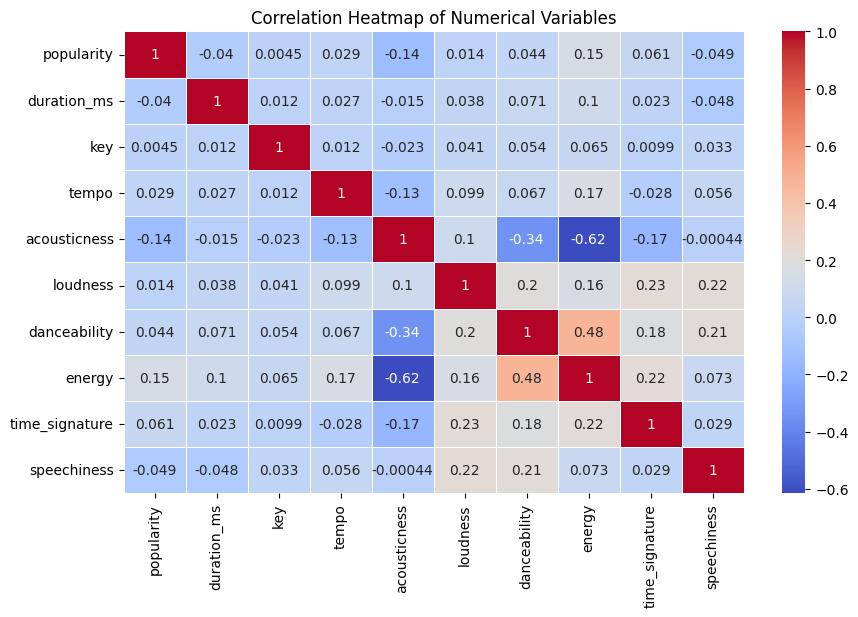


   B) HISTOGRAM VISUALIZATION


--- Popularity Distribution ---
count    62317.000000
mean        15.358361
std         18.626908
min          0.000000
25%          0.000000
50%          7.000000
75%         26.000000
max         93.000000
Name: popularity, dtype: float64


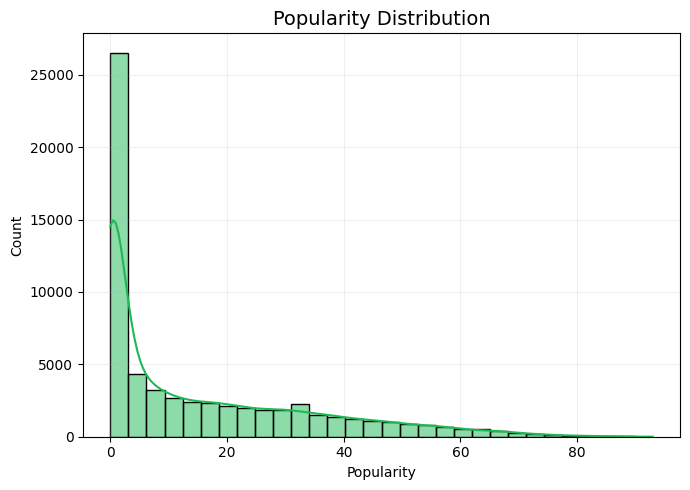

Saved: Popularity_distribution.png


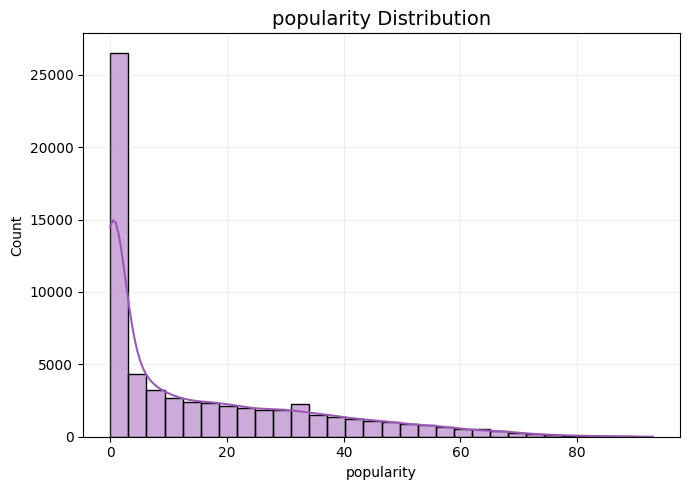

Saved: popularity_distribution.png


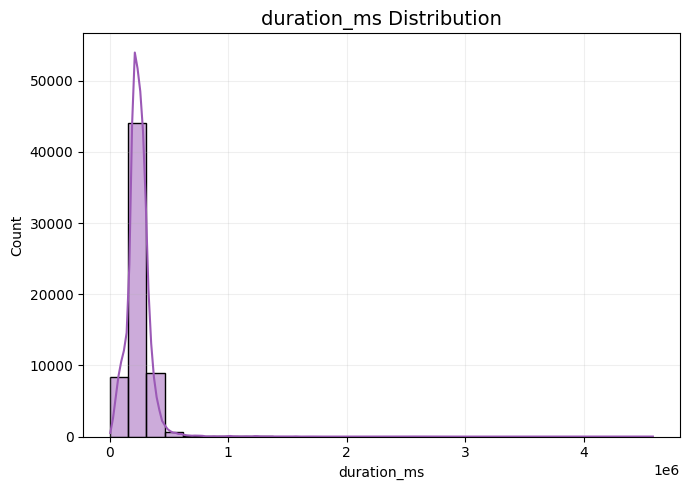

Saved: duration_ms_distribution.png


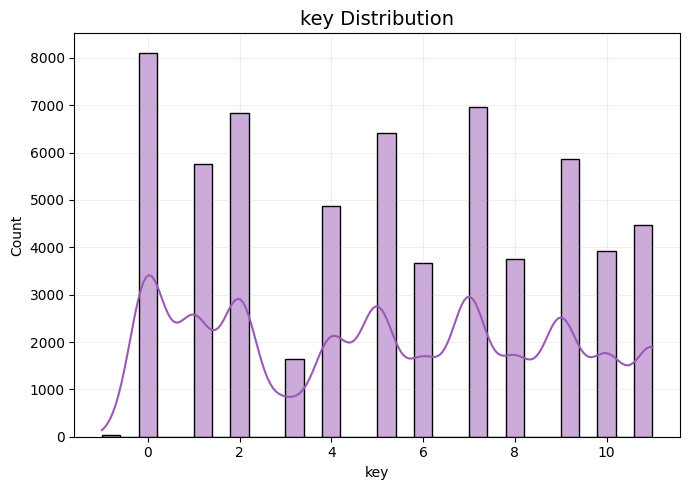

Saved: key_distribution.png


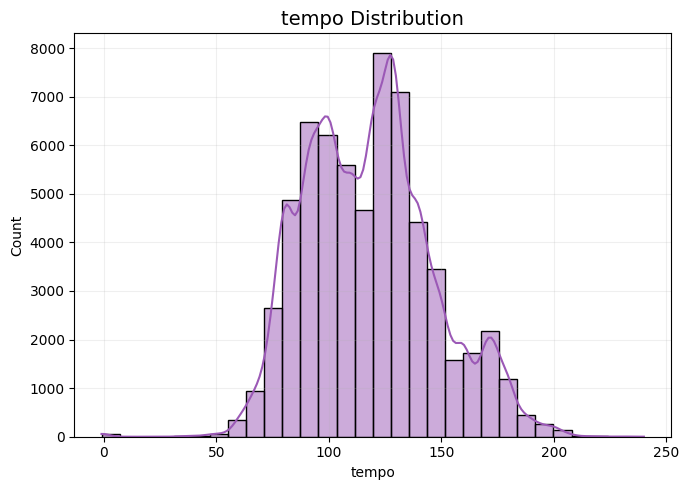

Saved: tempo_distribution.png


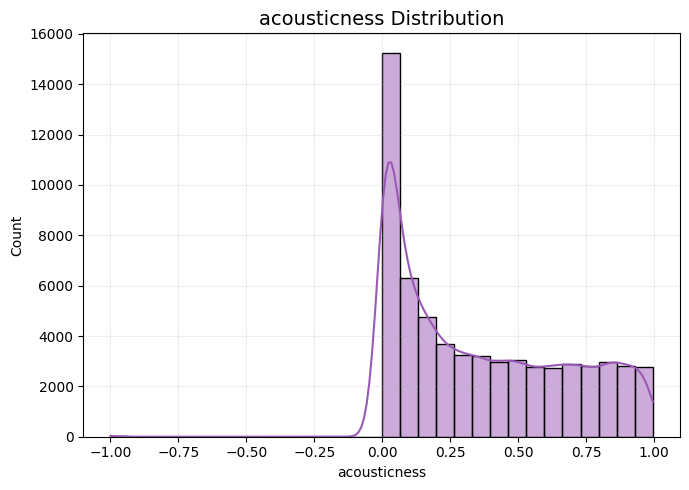

Saved: acousticness_distribution.png


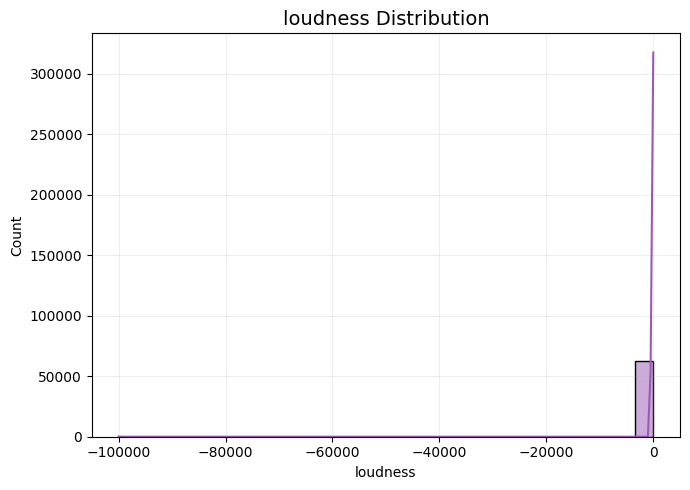

Saved: loudness_distribution.png


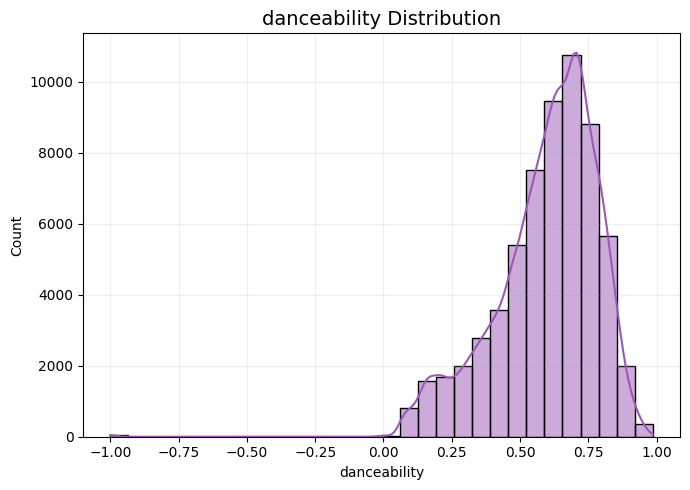

Saved: danceability_distribution.png


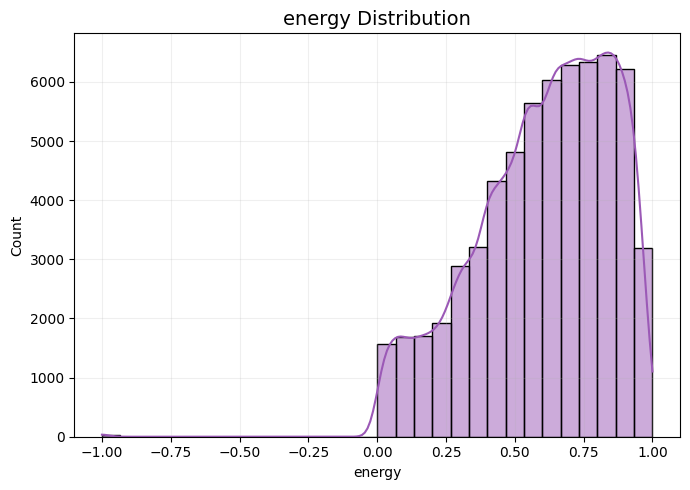

Saved: energy_distribution.png


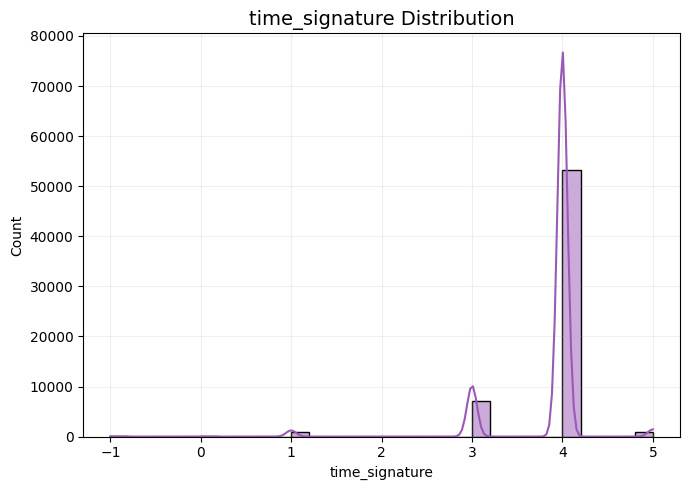

Saved: time_signature_distribution.png


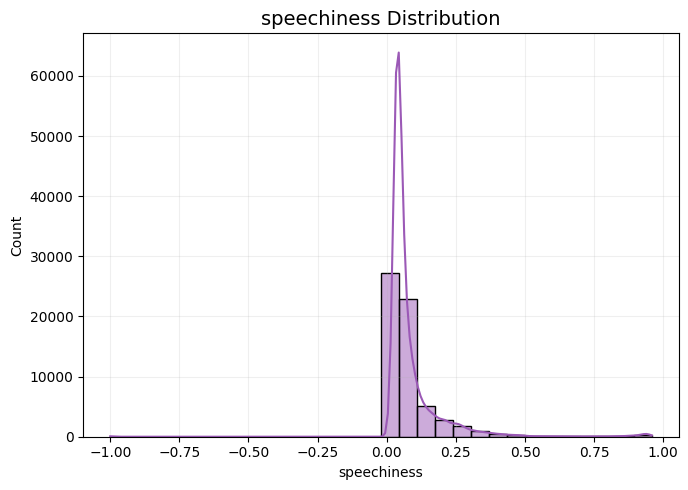

Saved: speechiness_distribution.png

  ANALYSIS COMPLETE


In [ ]:
# ===============================================
#   (A) Statistical Analysis of Numerical Variables
#   (B) Visualization Using Histograms
# ===============================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

# Load your dataset
spotify_df = pd.read_csv("spotify_tracks.csv")

# Convert selected columns to numeric
cols = ['popularity','duration_ms','key','tempo','acousticness','loudness',
        'danceability','energy','time_signature','speechiness']

for c in cols:
    if c in spotify_df.columns:
        spotify_df[c] = pd.to_numeric(spotify_df[c], errors='coerce')

# ======================================================
#   A) FULL STATISTICAL ANALYSIS OF NUMERICAL VARIABLES
# ======================================================

print("\n==============================")
print("   A) STATISTICAL ANALYSIS")
print("==============================\n")

stats_df = spotify_df[cols].describe().T
stats_df["variance"] = spotify_df[cols].var()
stats_df["skewness"] = spotify_df[cols].skew()
stats_df["kurtosis"] = spotify_df[cols].kurtosis()

# Normality test: D’Agostino K²
normality = {}
for col in cols:
    s = spotify_df[col].dropna()
    if len(s) > 20:
        k2, p = stats.normaltest(s)
        normality[col] = p
    else:
        normality[col] = np.nan

stats_df["normality_p"] = pd.Series(normality)

print(stats_df.round(4))
print("\nNOTE:")
print("- Skewness > ±1 → highly skewed")
print("- Kurtosis > 3 → heavy tails")
print("- Normality p < 0.05 → NOT normal distribution")

# ======================================================
#   OUTLIER DETECTION (IQR METHOD)
# ======================================================

print("\n==============================")
print("   OUTLIER DETECTION (IQR)")
print("==============================\n")

outlier_summary = {}

for col in cols:
    s = spotify_df[col].dropna()
    Q1 = s.quantile(0.25)
    Q3 = s.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = s[(s < lower_bound) | (s > upper_bound)]
    outlier_summary[col] = len(outliers)

outlier_df = pd.DataFrame.from_dict(outlier_summary, orient="index", columns=["Outliers"])
print(outlier_df)

# ======================================================
#   CORRELATION MATRIX
# ======================================================

print("\n==============================")
print("   CORRELATION MATRIX")
print("==============================\n")

corr = spotify_df[cols].corr()
print(corr)

plt.figure(figsize=(10,6))
sns.heatmap(corr, annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Heatmap of Numerical Variables")
plt.show()

# ======================================================
#   B) HISTOGRAM VISUALIZATION (IMPROVED)
# ======================================================

print("\n==============================")
print("   B) HISTOGRAM VISUALIZATION")
print("==============================\n")

# ---- 1. Popularity Distribution ----

print("\n--- Popularity Distribution ---")
print(spotify_df['popularity'].describe())

plt.figure(figsize=(7,5))
sns.histplot(
    spotify_df['popularity'].dropna(),
    bins=30, kde=True,
    color="#1DB954"   # Spotify Green
)
plt.title('Popularity Distribution', fontsize=14)
plt.xlabel('Popularity')
plt.ylabel('Count')
plt.grid(alpha=0.2)
plt.tight_layout()
plt.savefig("Popularity_distribution.png")
plt.show()
print("Saved: Popularity_distribution.png")

# ----  Histograms for ALL variables ----

for col in cols:
    plt.figure(figsize=(7,5))
    sns.histplot(
        spotify_df[col].dropna(),
        bins=30, kde=True,
        color="#9B59B6"
    )
    plt.title(f"{col} Distribution", fontsize=14)
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.grid(alpha=0.2)
    plt.tight_layout()
    plt.savefig(f"{col}_distribution.png")
    plt.show()
    print(f"Saved: {col}_distribution.png")

print("\n==============================")
print("  ANALYSIS COMPLETE")
print("==============================")


Using language column: language

=== LANGUAGE FREQUENCY TABLE (top 20) ===

           Count  Percentage
language                    
English    23392      37.537
Unknown    13005      20.869
Tamil      12681      20.349
Korean      6893      11.061
Hindi       5740       9.211
Telugu       324       0.520
Malayalam    282       0.453


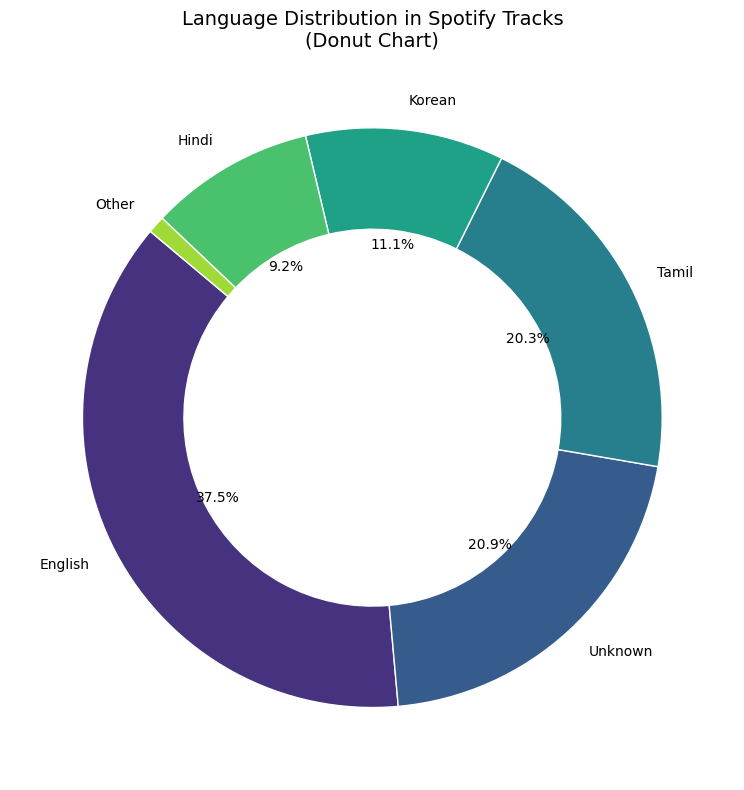

Saved: Language_Distribution.png


/tmp/ipython-input-2506586730.py:103: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top10.values, y=top10.index, palette='mako')


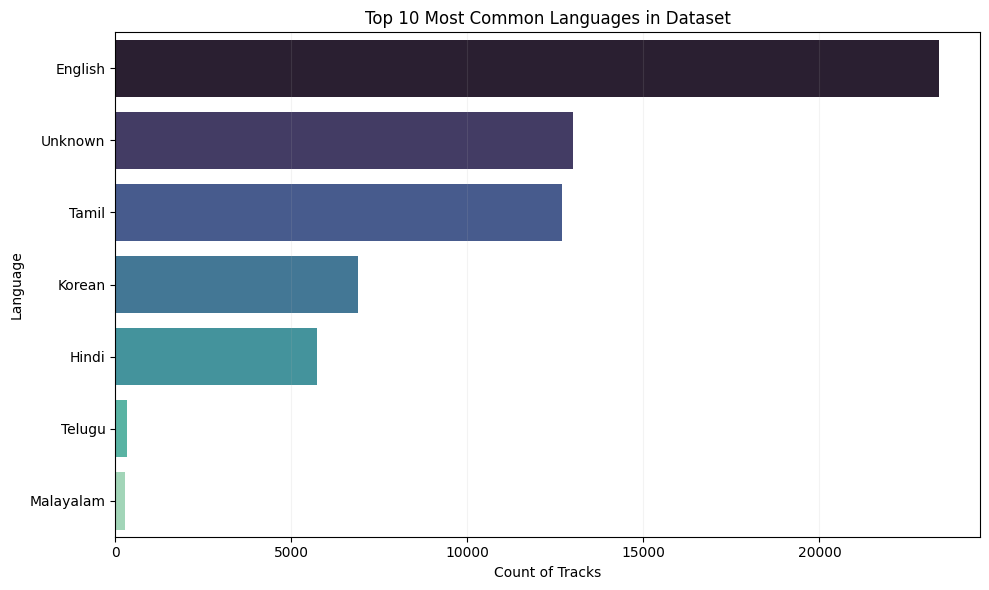

Saved: Language_Top10.png


/tmp/ipython-input-2506586730.py:120: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=lang_pop_mean_top10.values, y=lang_pop_mean_top10.index, palette='coolwarm')


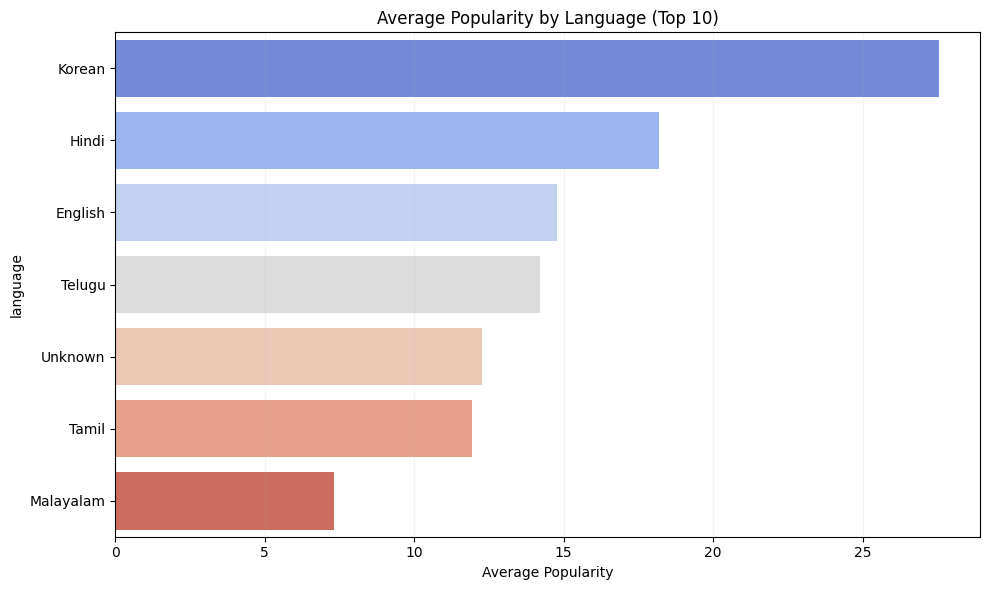

Saved: Language_vs_Popularity.png

=== RARE LANGUAGES (<1%) ===

language
Telugu       0.005199
Malayalam    0.004525
Name: count, dtype: float64


/tmp/ipython-input-2506586730.py:143: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=to_plot.values * 100, y=to_plot.index, palette='cubehelix')


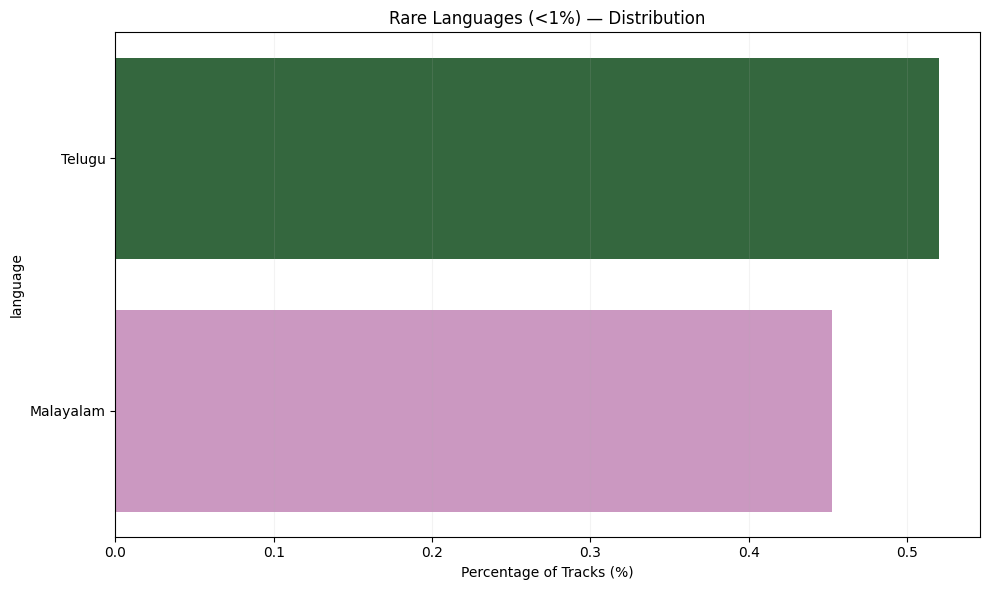

Saved: Language_Rare.png

=== LANGUAGE DIVERSITY METRICS ===
Shannon Entropy: 2.2127
Max Possible Entropy (for 7 categories): 2.8074
Normalized Entropy (0..1): 0.7882


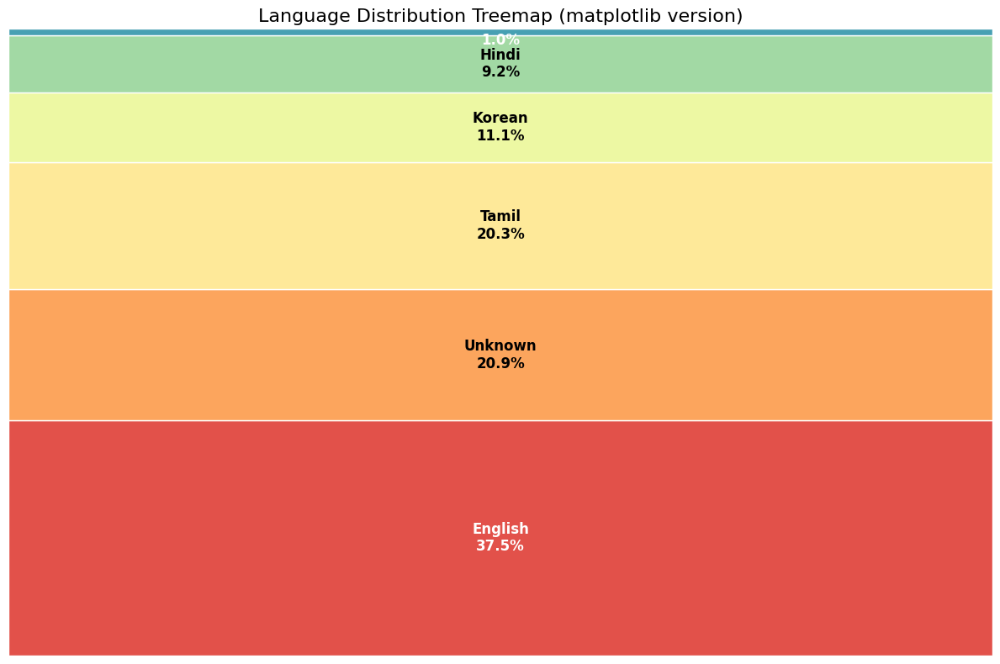

Saved: Language_Treemap.png

All language-analysis visuals saved. Check PNG files in the working directory.


In [ ]:


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import math

DATA_PATH = "spotify_tracks.csv"

# -------------------------
# Load dataset
# -------------------------
df = pd.read_csv(DATA_PATH)

# Attempt to find a language column if named differently
possible_lang_cols = ['language', 'lang', 'language_code', 'track_language']
lang_col = None
for c in possible_lang_cols:
    if c in df.columns:
        lang_col = c
        break

if lang_col is None:
    # fallback: create 'language' as Unknown if nothing exists
    df['language'] = 'Unknown'
    lang_col = 'language'
    print("No language column found — created 'language' with value 'Unknown' for all rows.")
else:
    print(f"Using language column: {lang_col}")

# Fill missing with 'Unknown'
df[lang_col] = df[lang_col].fillna('Unknown').astype(str)

# Make sure popularity is numeric for later aggregation
if 'popularity' in df.columns:
    df['popularity'] = pd.to_numeric(df['popularity'], errors='coerce')
else:
    df['popularity'] = np.nan

# -------------------------
# Frequency table & shares
# -------------------------
lang_series = df[lang_col]
lang_counts = lang_series.value_counts()
lang_share = lang_counts / lang_counts.sum()

freq_table = pd.DataFrame({
    'Count': lang_counts,
    'Percentage': (lang_share * 100).round(3)
})

print("\n=== LANGUAGE FREQUENCY TABLE (top 20) ===\n")
print(freq_table.head(20))

# -------------------------
# Prepare plotting series (group small slices into 'Other')
# -------------------------
threshold = 0.02  # 2% threshold for grouping into 'Other'
major = lang_share[lang_share >= threshold].sort_values(ascending=False)
other_share = lang_share[lang_share < threshold].sum()

if other_share > 0:
    lang_plot = pd.concat([major, pd.Series({'Other': other_share})])
else:
    lang_plot = major

# Ensure index names are strings
lang_plot.index = lang_plot.index.map(str)

# -------------------------
# 1) Donut chart (Language_Distribution.png)
# -------------------------
plt.figure(figsize=(8,8))
# Color palette
colors = sns.color_palette('viridis', n_colors=len(lang_plot))
wedges, texts, autotexts = plt.pie(
    lang_plot.values,
    labels=lang_plot.index,
    autopct=lambda pct: f"{pct:.1f}%" if pct >= 1 else "",  # hide tiny pct labels
    startangle=140,
    colors=colors,
    wedgeprops=dict(width=0.35, edgecolor='white')
)
# Draw center circle for donut look
centre_circle = plt.Circle((0,0),0.60,fc='white')
plt.gca().add_artist(centre_circle)
plt.title('Language Distribution in Spotify Tracks\n(Donut Chart)', fontsize=14)
plt.tight_layout()
plt.savefig('Language_Distribution.png', dpi=150)
plt.show()
print("Saved: Language_Distribution.png")

# -------------------------
# 2) Top 10 bar chart (Language_Top10.png)
# -------------------------
top10 = lang_counts.head(10)
plt.figure(figsize=(10,6))
sns.barplot(x=top10.values, y=top10.index, palette='mako')
plt.xlabel('Count of Tracks')
plt.ylabel('Language')
plt.title('Top 10 Most Common Languages in Dataset')
plt.grid(axis='x', alpha=0.15)
plt.tight_layout()
plt.savefig('Language_Top10.png', dpi=150)
plt.show()
print("Saved: Language_Top10.png")

# -------------------------
# 3) Avg popularity by language (top 10) (Language_vs_Popularity.png)
# -------------------------
lang_pop_mean = df.groupby(lang_col)['popularity'].mean().dropna().sort_values(ascending=False)
lang_pop_mean_top10 = lang_pop_mean.head(10)

plt.figure(figsize=(10,6))
sns.barplot(x=lang_pop_mean_top10.values, y=lang_pop_mean_top10.index, palette='coolwarm')
plt.xlabel('Average Popularity')
plt.title('Average Popularity by Language (Top 10)')
plt.grid(axis='x', alpha=0.15)
plt.tight_layout()
plt.savefig('Language_vs_Popularity.png', dpi=150)
plt.show()
print("Saved: Language_vs_Popularity.png")

# -------------------------
# 4) Rare languages (<1%) list + small bar chart (Language_Rare.png)
# -------------------------
rare_threshold = 0.01
rare_langs = lang_share[lang_share < rare_threshold].sort_values(ascending=False)
print("\n=== RARE LANGUAGES (<1%) ===\n")
if rare_langs.empty:
    print("No languages below 1% threshold.")
else:
    print(rare_langs)

    # plot top 20 rare languages (or all if fewer)
    to_plot = rare_langs.tail(20) if len(rare_langs) > 20 else rare_langs
    plt.figure(figsize=(10,6))
    sns.barplot(x=to_plot.values * 100, y=to_plot.index, palette='cubehelix')
    plt.xlabel('Percentage of Tracks (%)')
    plt.title('Rare Languages (<1%) — Distribution')
    plt.grid(axis='x', alpha=0.15)
    plt.tight_layout()
    plt.savefig('Language_Rare.png', dpi=150)
    plt.show()
    print("Saved: Language_Rare.png")

# -------------------------
# 5) Shannon Entropy
# -------------------------
p = lang_share.values

p_nonzero = p[p > 0]
shannon_entropy = -(p_nonzero * np.log2(p_nonzero)).sum()
max_entropy = math.log2(len(p_nonzero)) if len(p_nonzero) > 0 else 0
normalized_entropy = shannon_entropy / max_entropy if max_entropy > 0 else 0

print("\n=== LANGUAGE DIVERSITY METRICS ===")
print(f"Shannon Entropy: {shannon_entropy:.4f}")
print(f"Max Possible Entropy (for {len(p_nonzero)} categories): {max_entropy:.4f}")
print(f"Normalized Entropy (0..1): {normalized_entropy:.4f}")

# -------------------------
# 6) Matplotlib-only Treemap (Language_Treemap.png)
# -------------------------
# We'll stack rectangles vertically by share (simple treemap-like layout)
labels = [f"{name}\n{value*100:.1f}%" for name, value in zip(lang_plot.index, lang_plot.values)]
sizes = lang_plot.values
colors = sns.color_palette("Spectral", len(sizes))

fig, ax = plt.subplots(figsize=(12, 8))
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
ax.axis('off')

current_y = 0.0
for i, size in enumerate(sizes):
    h = size
    rect = plt.Rectangle((0, current_y), 1.0, h, color=colors[i], ec='white')
    ax.add_patch(rect)

    text_color = 'white' if (colors[i][0]*0.299 + colors[i][1]*0.587 + colors[i][2]*0.114) < 0.6 else 'black'
    ax.text(0.5, current_y + h/2, labels[i], ha='center', va='center', fontsize=12, color=text_color, weight='bold')
    current_y += h

plt.title('Language Distribution Treemap (matplotlib version)', fontsize=16)
plt.tight_layout()
plt.savefig('Language_Treemap.png', dpi=150)
plt.show()
print("Saved: Language_Treemap.png")

print("\nAll language-analysis visuals saved. Check PNG files in the working directory.")


6.BIVARIATE ANALYSIS

/tmp/ipython-input-2697292250.py:78: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=grouped.values, y=grouped.index, palette=[color]*len(grouped))


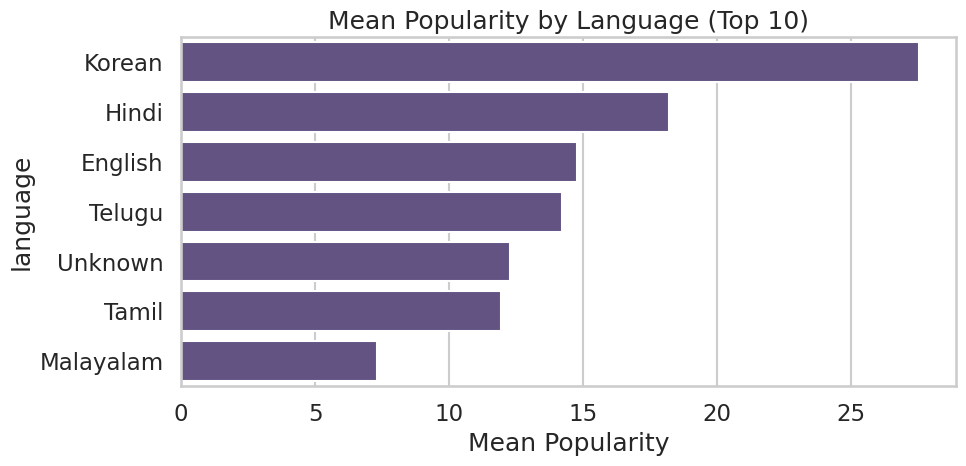

Saved: popularity_by_language.png


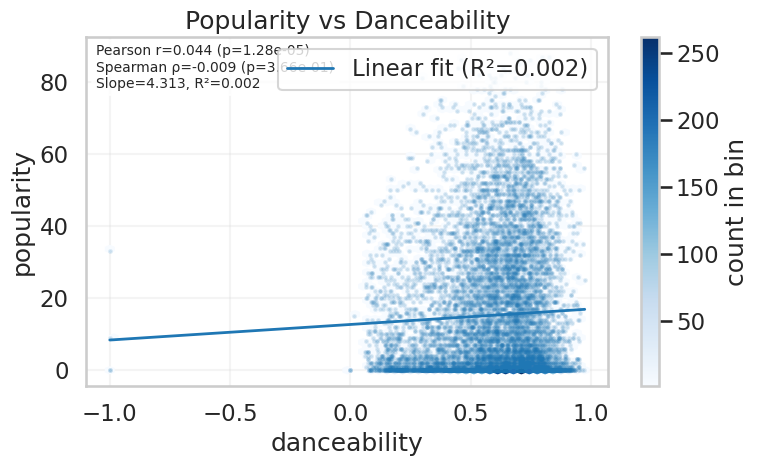

Saved: Popularity_vs_Danceability.png
Stats: {'pearson_r': '0.0436', 'pearson_p': '0.0000', 'spearman_r': '-0.0090', 'spearman_p': '0.3662', 'slope': '4.3133', 'intercept': '12.6990', 'r2': '0.0019'}


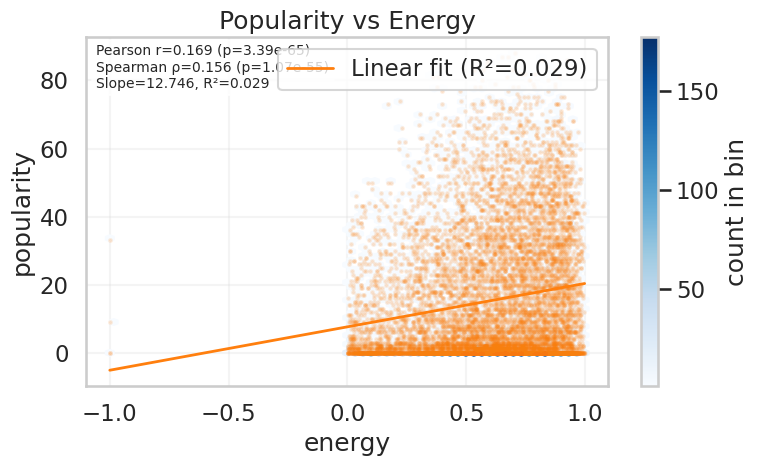

Saved: Popularity_vs_Energy.png
Stats: {'pearson_r': '0.1693', 'pearson_p': '0.0000', 'spearman_r': '0.1563', 'spearman_p': '0.0000', 'slope': '12.7458', 'intercept': '7.6427', 'r2': '0.0287'}


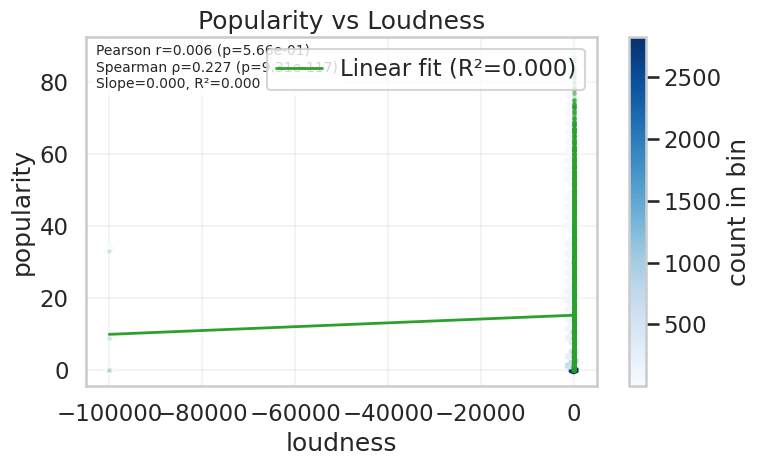

Saved: Popularity_vs_Loudness.png
Stats: {'pearson_r': '0.0057', 'pearson_p': '0.5660', 'spearman_r': '0.2267', 'spearman_p': '0.0000', 'slope': '0.0001', 'intercept': '15.2723', 'r2': '0.0000'}


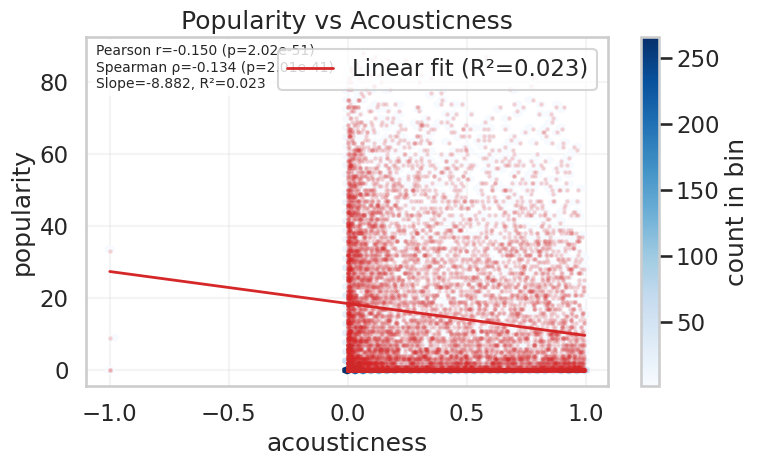

Saved: Popularity_vs_Acousticness.png
Stats: {'pearson_r': '-0.1500', 'pearson_p': '0.0000', 'spearman_r': '-0.1342', 'spearman_p': '0.0000', 'slope': '-8.8823', 'intercept': '18.5176', 'r2': '0.0225'}


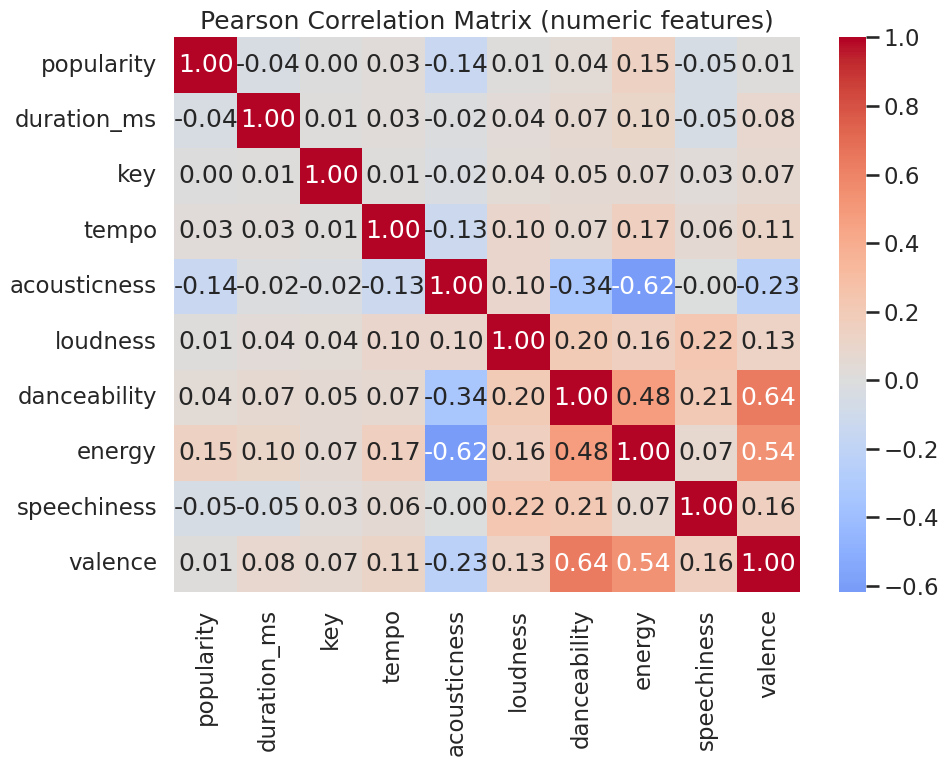

Saved: pearson_correlation_heatmap.png


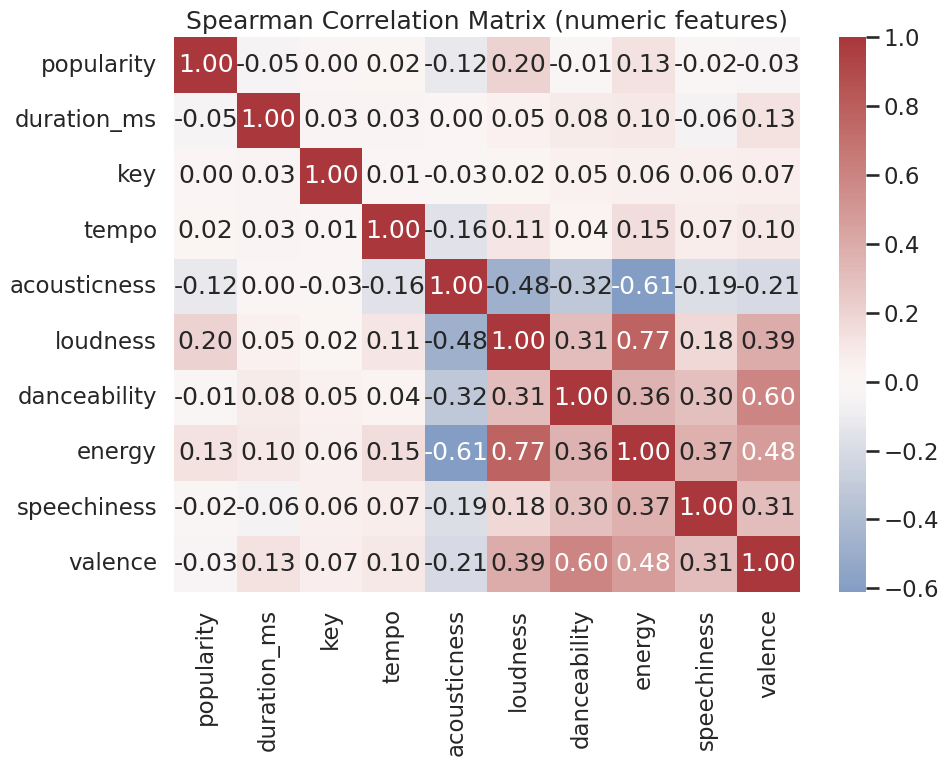

Saved: spearman_correlation_heatmap.png

Top absolute correlations with popularity:
popularity      1.000000
energy          0.147607
acousticness   -0.136356
speechiness    -0.049285
danceability    0.043905
duration_ms    -0.039676
tempo           0.028823
loudness        0.013599
valence         0.010925
key             0.004537
dtype: float64

Mutual information (higher = more dependency on popularity):
loudness        0.089424
duration_ms     0.086089
tempo           0.062815
acousticness    0.043493
speechiness     0.033386
valence         0.033168
energy          0.030674
danceability    0.025662
dtype: float64


/tmp/ipython-input-2697292250.py:192: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=mi_series.values, y=mi_series.index, palette='rocket')


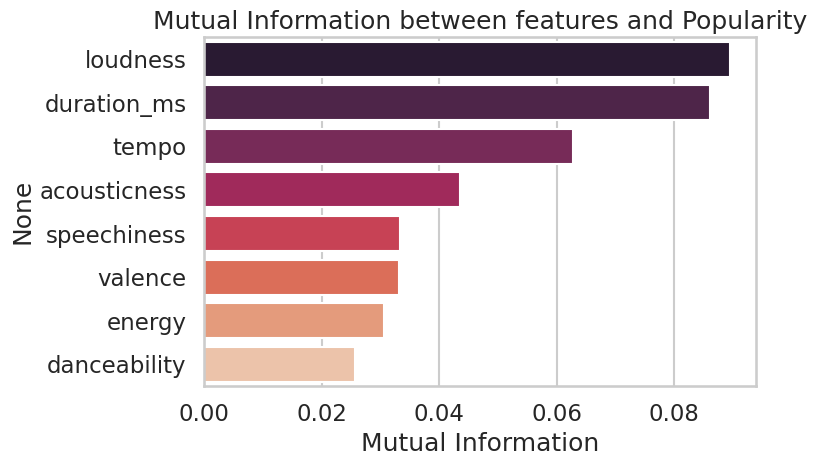

Saved: mutual_info_popularity.png


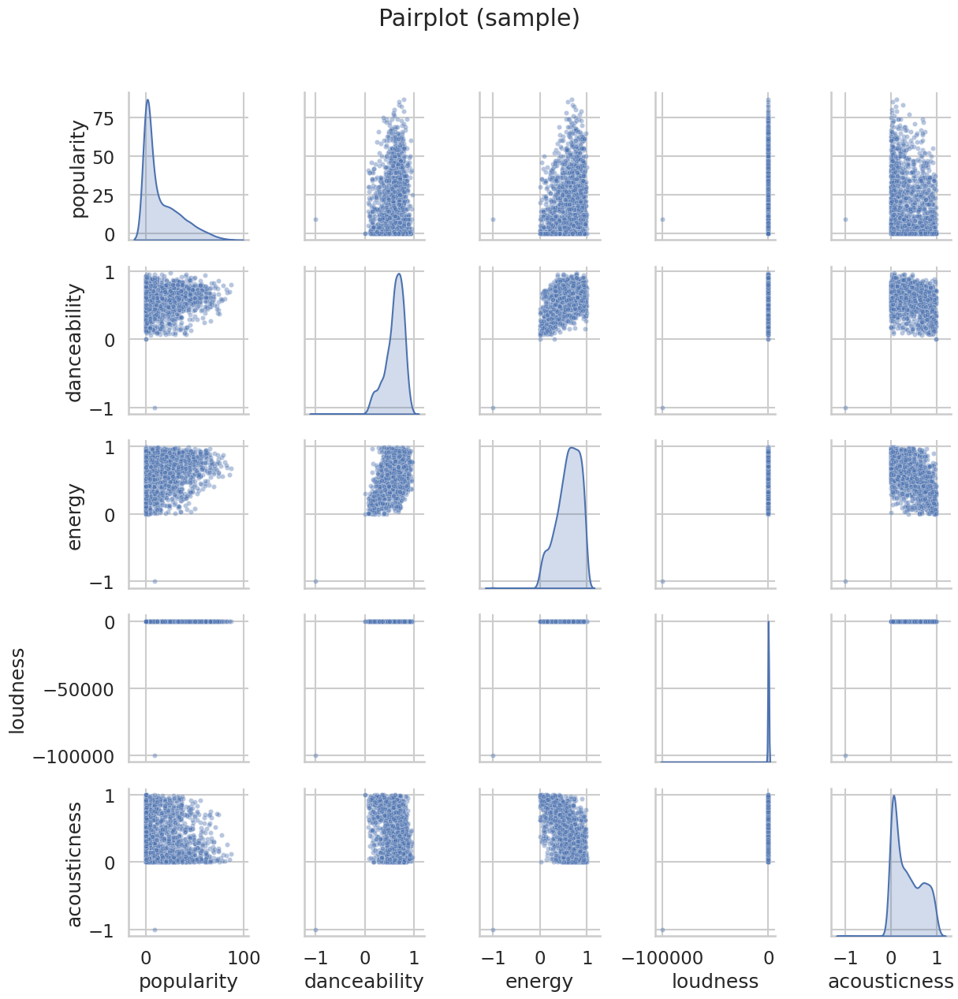

Saved: pairplot_sample.png

Bivariate analysis complete. All plots saved.


In [2]:
# bivariate_analysis_enhanced.py

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.feature_selection import mutual_info_regression

# Settings
DATA_PATH = "spotify_tracks.csv"
SAMPLE_N = 10000
sns.set(style="whitegrid", context="talk")

# Load
spotify_df = pd.read_csv(DATA_PATH, on_bad_lines='skip')

# Ensure numeric conversion for features we'll use
numeric_cols = ['popularity','duration_ms','key','tempo','acousticness','loudness',
                'danceability','energy','time_signature','speechiness','valence']
for c in numeric_cols:
    if c in spotify_df.columns:
        spotify_df[c] = pd.to_numeric(spotify_df[c], errors='coerce')

# Basic clean subset for analysis (drop rows missing popularity)
analysis_df = spotify_df[numeric_cols].copy()
analysis_df = analysis_df.reset_index(drop=True)


def regression_stats_and_plot(x, y, ax=None, color='#333333', xlabel=None, ylabel='Popularity', annotate=True):
    # drop NA pairs
    mask = (~np.isnan(x)) & (~np.isnan(y))
    x0 = x[mask]
    y0 = y[mask]
    if len(x0) < 2:
        return None
    # Pearson & Spearman
    pearson_r, pearson_p = stats.pearsonr(x0, y0)
    spearman_r, spearman_p = stats.spearmanr(x0, y0)
    # Linear fit
    slope, intercept, r_value, p_value, stderr = stats.linregress(x0, y0)
    r2 = r_value**2

    # Plot regression line using slope/intercept
    xx = np.linspace(np.nanmin(x0), np.nanmax(x0), 200)
    yy = intercept + slope * xx

    if ax is not None:
        ax.plot(xx, yy, color=color, linewidth=2, label=f'Linear fit (R²={r2:.3f})')
    stats_dict = {
        'pearson_r': pearson_r, 'pearson_p': pearson_p,
        'spearman_r': spearman_r, 'spearman_p': spearman_p,
        'slope': slope, 'intercept': intercept, 'r2': r2
    }
    if annotate and ax is not None:
        txt = (f"Pearson r={pearson_r:.3f} (p={pearson_p:.2e})\n"
               f"Spearman ρ={spearman_r:.3f} (p={spearman_p:.2e})\n"
               f"Slope={slope:.3f}, R²={r2:.3f}")
        ax.text(0.02, 0.98, txt, transform=ax.transAxes, fontsize=10,
                verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    return stats_dict

# ------------------------------------------------------------------------------
# 1) Mean popularity by category: language (top 10)
# ------------------------------------------------------------------------------
def plot_mean_popularity(dataframe, category, title, filename, top_n=10, color='#6A6AF8'):
    data = dataframe[[category, 'popularity']].dropna()
    top_vals = data[category].value_counts().nlargest(top_n).index
    data = data[data[category].isin(top_vals)]
    grouped = data.groupby(category)['popularity'].mean().sort_values(ascending=False)

    plt.figure(figsize=(10,5))
    sns.barplot(x=grouped.values, y=grouped.index, palette=[color]*len(grouped))
    plt.title(title)
    plt.xlabel('Mean Popularity')
    plt.ylabel(category)
    plt.tight_layout()
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    plt.show()
    print(f"Saved: {filename}")

# run language popularity plot if language column exists
if 'language' in spotify_df.columns:
    plot_mean_popularity(spotify_df, 'language', 'Mean Popularity by Language (Top 10)', 'popularity_by_language.png', top_n=10, color='#5F4B8B')
else:
    print("Column 'language' not found. Skipping language mean-popularity plot.")

# ------------------------------------------------------------------------------
# 2) Scatter + regression plots: (danceability, energy, loudness, acousticness) vs popularity
#    - Use different color for each plot
#    - Use hexbin as alternative if dense
# ------------------------------------------------------------------------------
scatter_pairs = [
    ('danceability', '#1f77b4', 'Popularity vs Danceability', 'Popularity_vs_Danceability.png'),
    ('energy',       '#ff7f0e', 'Popularity vs Energy',       'Popularity_vs_Energy.png'),
    ('loudness',     '#2ca02c', 'Popularity vs Loudness',     'Popularity_vs_Loudness.png'),
    ('acousticness', '#d62728', 'Popularity vs Acousticness', 'Popularity_vs_Acousticness.png'),
]

# Ensure popularity exists
if 'popularity' not in analysis_df.columns:
    raise RuntimeError("Column 'popularity' not found in dataset.")

for feature, color, title, fname in scatter_pairs:
    if feature not in analysis_df.columns:
        print(f"Feature '{feature}' not available — skipping {title}")
        continue

    # sample for plotting
    sample = analysis_df[[feature, 'popularity']].dropna()
    n = min(len(sample), SAMPLE_N)
    sample = sample.sample(n, random_state=42)

    # Create figure
    fig, ax = plt.subplots(figsize=(8,5))

    # Use hexbin if sample is large enough to show density; else scatter
    if n > 2000:
        hb = ax.hexbin(sample[feature], sample['popularity'], gridsize=60, cmap='Blues', mincnt=1)
        cb = fig.colorbar(hb, ax=ax)
        cb.set_label('count in bin')
        # overlay a light scatter for visibility
        ax.scatter(sample[feature], sample['popularity'], s=4, alpha=0.12, color=color)
    else:
        ax.scatter(sample[feature], sample['popularity'], alpha=0.35, s=20, color=color, label='samples')

    # Fit and annotate regression
    stats_info = regression_stats_and_plot(sample[feature].values, sample['popularity'].values, ax=ax, color=color)
    ax.set_title(title)
    ax.set_xlabel(feature)
    ax.set_ylabel('popularity')
    ax.grid(alpha=0.2)
    ax.legend(loc='upper right')
    plt.tight_layout()
    plt.savefig(fname, dpi=300)
    plt.show()
    print(f"Saved: {fname}")
    if stats_info:
        print("Stats:", {k: (f"{v:.4f}" if isinstance(v, float) else v) for k, v in stats_info.items()})

# ------------------------------------------------------------------------------
# 3) Additional deep checks: Spearman vs Pearson for all numeric features
# ------------------------------------------------------------------------------
num = analysis_df.select_dtypes(include=[np.number]).drop(columns=['time_signature'], errors='ignore')  # optionally drop if integer categorical
pearson = num.corr(method='pearson')
spearman = num.corr(method='spearman')

plt.figure(figsize=(10,8))
sns.heatmap(pearson, annot=True, fmt=".2f", cmap='coolwarm', center=0)
plt.title('Pearson Correlation Matrix (numeric features)')
plt.tight_layout()
plt.savefig('pearson_correlation_heatmap.png', dpi=300)
plt.show()
print("Saved: pearson_correlation_heatmap.png")

plt.figure(figsize=(10,8))
sns.heatmap(spearman, annot=True, fmt=".2f", cmap='vlag', center=0)
plt.title('Spearman Correlation Matrix (numeric features)')
plt.tight_layout()
plt.savefig('spearman_correlation_heatmap.png', dpi=300)
plt.show()
print("Saved: spearman_correlation_heatmap.png")

# Print top correlations with popularity
if 'popularity' in num.columns:
    pop_corr = num.corrwith(num['popularity']).dropna().sort_values(key=lambda s: np.abs(s), ascending=False)
    print("\nTop absolute correlations with popularity:")
    print(pop_corr.head(10))

# ------------------------------------------------------------------------------
# 4) Mutual Information (non-linear dependency) with popularity (research-level)
# ------------------------------------------------------------------------------
# mutual_info_regression requires no-nan and 2D X
mi_features = ['danceability','energy','loudness','acousticness','tempo','duration_ms','speechiness','valence']
mi_features = [f for f in mi_features if f in analysis_df.columns]
mi_df = analysis_df[mi_features + ['popularity']].dropna()
if len(mi_df) >= 50:
    X = mi_df[mi_features].values
    y = mi_df['popularity'].values
    try:
        mi = mutual_info_regression(X, y, random_state=42)
        mi_series = pd.Series(mi, index=mi_features).sort_values(ascending=False)
        print("\nMutual information (higher = more dependency on popularity):")
        print(mi_series)
        # plot MI
        plt.figure(figsize=(8,5))
        sns.barplot(x=mi_series.values, y=mi_series.index, palette='rocket')
        plt.xlabel('Mutual Information')
        plt.title('Mutual Information between features and Popularity')
        plt.tight_layout()
        plt.savefig('mutual_info_popularity.png', dpi=300)
        plt.show()
        print("Saved: mutual_info_popularity.png")
    except Exception as e:
        print("Mutual information computation failed:", e)
else:
    print("Not enough data to compute mutual information reliably (need >=50 rows).")

# ------------------------------------------------------------------------------
# 5) Pair-plot for a small set of features (visual exploration)
# ------------------------------------------------------------------------------
pair_features = ['popularity','danceability','energy','loudness','acousticness']
pair_features = [f for f in pair_features if f in analysis_df.columns]
if len(pair_features) > 1:
    small = analysis_df[pair_features].dropna().sample(n=min(len(analysis_df), 2000), random_state=42)
    sns.pairplot(small, diag_kind='kde', plot_kws={'alpha':0.4, 's':20})
    plt.suptitle('Pairplot (sample)', y=1.02)
    plt.tight_layout()
    plt.savefig('pairplot_sample.png', dpi=300)
    plt.show()
    print("Saved: pairplot_sample.png")

print("\nBivariate analysis complete. All plots saved.")


7.multivariate_analysis

Loading data from: spotify_tracks.csv
Shape: (62317, 22)

Null counts for important columns after cleaning:

popularity           0
danceability        35
energy              35
valence             35
acousticness        35
instrumentalness    35
speechiness         35
loudness            35
tempo               35
mode                 0
dtype: int64

Top popularity quartile threshold: 26.0 (tracks >= this are 'highly popular')
Number of tracks in top quartile: 16070

Top 10 danceability-energy-valence combinations among highly popular tracks:
  danceability_bin energy_bin valence_bin  count
0              Low        Low         Low   2160
1             High       High        High   1419
2             High     Medium        High   1221
3           Medium       High        High    950
4           Medium       High      Medium    806
5             High     Medium      Medium    771
6           Medium     Medium      Medium    763
7              Low     Medium         Low    729
8         

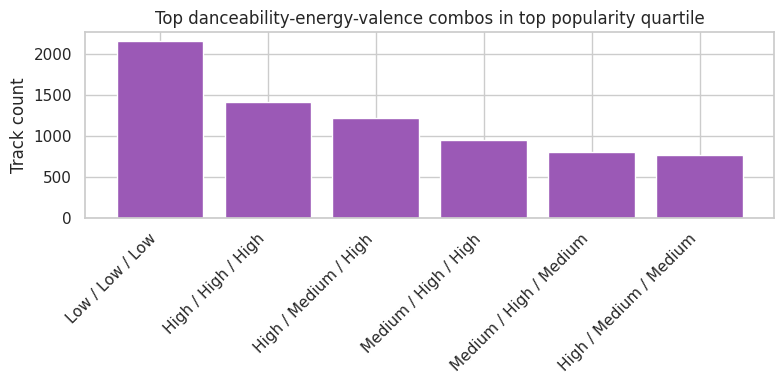

Saved: /mnt/data/multivariate_outputs/top_dance_energy_valence_combos.png
Saved combo counts CSV.

Rows available for clustering (no NaNs in cluster features): 62282

Cluster centers (approximate feature values):
   cluster  acousticness  instrumentalness  speechiness
0        0      0.328608          0.014748     0.069421
1        1      0.507648          0.811488     0.053280
2        2      0.410830          0.017640     0.439165

Cluster summary with high-popularity proportions:
   cluster  n_tracks  mean_popularity  mean_acousticness  \
0        0     48337        16.714484           0.328620   
2        2      3631        11.736436           0.410776   
1        1     10314        10.312973           0.507648   

   mean_instrumentalness  mean_speechiness  high_pop_count  high_pop_ratio  
0               0.014747          0.069439           13931        0.288206  
2               0.017661          0.439423             713        0.196365  
1               0.811488          0.0532

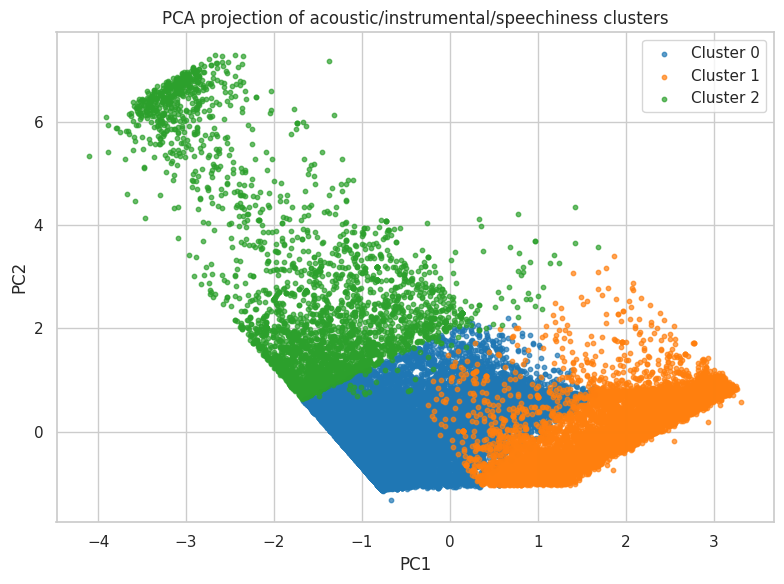

Saved: /mnt/data/multivariate_outputs/PCA_projection_clusters.png

Multivariate analysis complete. Outputs saved in: /mnt/data/multivariate_outputs


In [14]:
# multivariate_analysis

import os
import sys
import math
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

sns.set(style="whitegrid", context="notebook")

# -------------------------
# Config / paths
# -------------------------
DATA_PATH = "spotify_tracks.csv"
OUT_DIR = "/mnt/data/multivariate_outputs"
os.makedirs(OUT_DIR, exist_ok=True)

# -------------------------

# -------------------------
HIST_COLOR = "#9B59B6"
SCATTER_PALETTE = "tab10"
LINE_COLOR = "#1DB954"
BAR_COLOR = HIST_COLOR

# -------------------------
# Load data
# -------------------------
print("Loading data from:", DATA_PATH)
spotify_df = pd.read_csv(DATA_PATH, on_bad_lines="skip")
print("Shape:", spotify_df.shape)

# -------------------------
# 0. Quick cleaning
# -------------------------
maybe_invalid_minus_one = [
    "acousticness", "danceability", "duration_ms", "energy", "instrumentalness",
    "liveness", "loudness", "speechiness", "tempo", "time_signature", "valence"
]

for col in maybe_invalid_minus_one:
    if col in spotify_df.columns:
        # coerce to numeric first to avoid string comparisons
        spotify_df[col] = pd.to_numeric(spotify_df[col], errors="coerce")
        spotify_df.loc[spotify_df[col] == -1, col] = np.nan

# Loudness suspiciously low values -> treat as NaN (threshold adjustable)
if "loudness" in spotify_df.columns:
    spotify_df.loc[pd.to_numeric(spotify_df["loudness"], errors="coerce") < -60, "loudness"] = np.nan

# Create year column if missing (try release_date fallback)
if "year" not in spotify_df.columns:
    if "release_date" in spotify_df.columns:
        try:
            spotify_df["year"] = pd.to_datetime(spotify_df["release_date"], errors="coerce").dt.year
            print("Derived 'year' from 'release_date'.")
        except Exception:
            spotify_df["year"] = np.nan
    else:
        spotify_df["year"] = np.nan

# Show null counts for important columns (only existing ones)
important_cols = ["popularity","danceability","energy","valence","acousticness",
                  "instrumentalness","speechiness","loudness","tempo","mode"]
existing_importants = [c for c in important_cols if c in spotify_df.columns]
print("\nNull counts for important columns after cleaning:\n")
print(spotify_df[existing_importants].isnull().sum())

# -------------------------
# Define high popularity (top quartile)
# -------------------------
if "popularity" in spotify_df.columns:
    pop_75 = spotify_df["popularity"].quantile(0.75)
    high_pop = spotify_df[spotify_df["popularity"] >= pop_75].copy()
    print(f"\nTop popularity quartile threshold: {pop_75} (tracks >= this are 'highly popular')")
    print("Number of tracks in top quartile:", len(high_pop))
else:
    raise KeyError("Column 'popularity' is required for this analysis but was not found in dataset.")

# -------------------------
# 1) Combination: danceability / energy / valence (tercile bins)
# -------------------------
def tercile_labels(series):
    """Return a pandas Series of 'Low'/'Medium'/'High' labels based on terciles of series."""
    s = pd.to_numeric(series, errors="coerce")
    q1 = s.quantile(1/3)
    q2 = s.quantile(2/3)
    def _label(x):
        if pd.isna(x):
            return np.nan
        if x <= q1:
            return "Low"
        elif x <= q2:
            return "Medium"
        else:
            return "High"
    return s.apply(_label)

tercile_feats = []
for feat in ["danceability","energy","valence"]:
    if feat in high_pop.columns:
        binned_col = f"{feat}_bin"
        high_pop[binned_col] = tercile_labels(high_pop[feat])
        tercile_feats.append(binned_col)
    else:
        print(f"Warning: '{feat}' not found — skipping tercile binning for that feature.")

if len(tercile_feats) > 0:
    combo_counts = high_pop.groupby([c for c in tercile_feats]).size().reset_index(name="count")
    combo_counts = combo_counts.sort_values("count", ascending=False).reset_index(drop=True)
    print("\nTop 10 danceability-energy-valence combinations among highly popular tracks:")
    print(combo_counts.head(10))

    # Plot top 6 combos (if exist)
    topN = 6
    top_combos = combo_counts.head(topN).copy()
    top_combos["combo"] = top_combos.apply(lambda r: " / ".join([r[c] for c in tercile_feats]), axis=1)
    plt.figure(figsize=(8,4))
    plt.bar(top_combos["combo"], top_combos["count"], color=BAR_COLOR)
    plt.title("Top danceability-energy-valence combos in top popularity quartile")
    plt.ylabel("Track count")
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    fname = os.path.join(OUT_DIR, "top_dance_energy_valence_combos.png")
    plt.savefig(fname, dpi=150, bbox_inches="tight")
    plt.show()
    print("Saved:", fname)

    # Save combo counts csv
    combo_counts.to_csv(os.path.join(OUT_DIR, "combo_counts_high_pop.csv"), index=False)
    print("Saved combo counts CSV.")
else:
    print("\nNo tercile binned features available to compute combos.")

# -------------------------
# 2) Clustering: acousticness, instrumentalness, speechiness
# -------------------------
cluster_features = [f for f in ["acousticness","instrumentalness","speechiness"] if f in spotify_df.columns]
if len(cluster_features) < 2:
    print("\nNot enough clustering features present (need >=2). Found:", cluster_features)
else:
    cluster_df = spotify_df[cluster_features + ["popularity"]].dropna()
    print("\nRows available for clustering (no NaNs in cluster features):", len(cluster_df))

    # Scale features
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(cluster_df[cluster_features])

    # Choose k (configurable)
    k = 3
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    cluster_labels = kmeans.fit_predict(X_scaled)
    cluster_df = cluster_df.reset_index(drop=True)
    cluster_df["cluster"] = cluster_labels

    # Inverse transform centers for interpretability
    centers_scaled = kmeans.cluster_centers_
    centers = scaler.inverse_transform(centers_scaled)
    centers_df = pd.DataFrame(centers, columns=cluster_features)
    centers_df["cluster"] = range(k)
    centers_df = centers_df[["cluster"] + cluster_features]
    print("\nCluster centers (approximate feature values):")
    print(centers_df)

    # Cluster summary
    cluster_summary = cluster_df.groupby("cluster").agg(
        n_tracks=("popularity","size"),
        mean_popularity=("popularity","mean"),
        mean_acousticness=("acousticness","mean"),
        mean_instrumentalness=("instrumentalness","mean"),
        mean_speechiness=("speechiness","mean"),
        high_pop_count=("popularity", lambda s: (s >= pop_75).sum())
    ).reset_index()
    cluster_summary["high_pop_ratio"] = cluster_summary["high_pop_count"] / cluster_summary["n_tracks"]
    cluster_summary = cluster_summary.sort_values("high_pop_ratio", ascending=False)
    print("\nCluster summary with high-popularity proportions:")
    print(cluster_summary)

    # Save cluster outputs
    cluster_summary.to_csv(os.path.join(OUT_DIR, "cluster_summary.csv"), index=False)
    centers_df.to_csv(os.path.join(OUT_DIR, "cluster_centers.csv"), index=False)
    cluster_df.to_csv(os.path.join(OUT_DIR, "clustered_rows_sample.csv"), index=False)

    # 2D PCA visualization for clusters (for readability)
    try:
        pca = PCA(n_components=2, random_state=42)
        X_pca = pca.fit_transform(X_scaled)
        plt.figure(figsize=(8,6))
        palette = sns.color_palette(SCATTER_PALETTE, n_colors=k)
        for cl in range(k):
            mask = cluster_labels == cl
            plt.scatter(X_pca[mask,0], X_pca[mask,1], label=f"Cluster {cl}", s=10, alpha=0.7, color=palette[cl])
        plt.title("PCA projection of acoustic/instrumental/speechiness clusters")
        plt.xlabel("PC1")
        plt.ylabel("PC2")
        plt.legend()
        plt.tight_layout()
        fname = os.path.join(OUT_DIR, "PCA_projection_clusters.png")
        plt.savefig(fname, dpi=150, bbox_inches="tight")
        plt.show()
        print("Saved:", fname)
    except Exception as e:
        print("PCA plotting failed:", e)

# -------------------------
# Final notes & quick saves
# -------------------------
print("\nMultivariate analysis complete. Outputs saved in:", OUT_DIR)


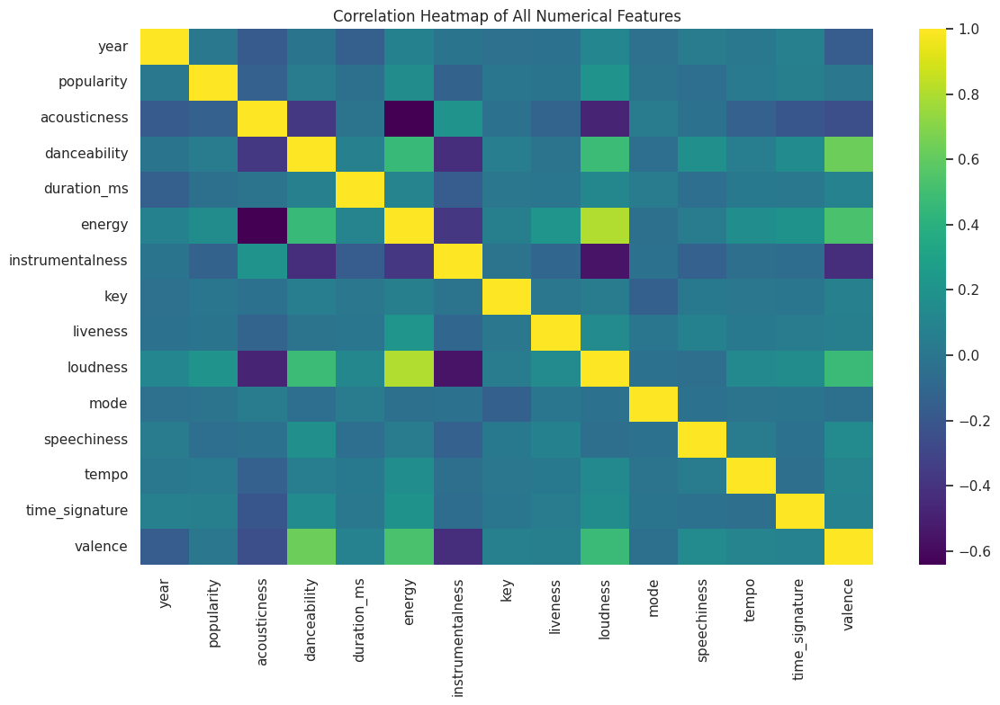

In [15]:
# ============================================================
# Correlation Heatmap (Numerical Variables)
# ============================================================
num_df = spotify_df.select_dtypes(include=[np.number]).dropna()

plt.figure(figsize=(12,8))
sns.heatmap(num_df.corr(), annot=False, cmap="viridis")
plt.title("Correlation Heatmap of All Numerical Features")
plt.tight_layout()
plt.savefig(os.path.join(OUT_DIR, "correlation_heatmap_all_numerical.png"))
plt.show()


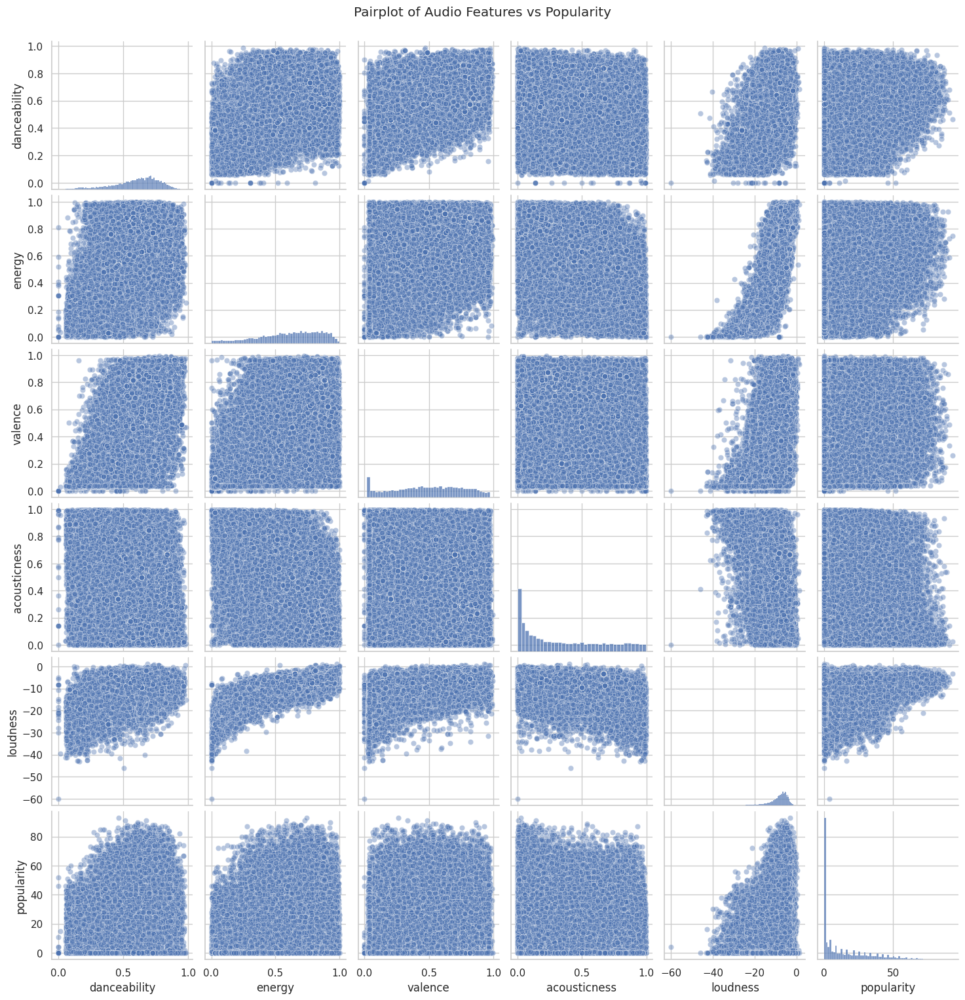

In [16]:
# ============================================================
#  Pairplot of Key Features vs Popularity
# ============================================================
pair_cols = ["danceability", "energy", "valence", "acousticness", "loudness", "popularity"]
pair_df = spotify_df[pair_cols].dropna()

sns.pairplot(pair_df, diag_kind="hist", plot_kws={"alpha":0.4})
plt.suptitle("Pairplot of Audio Features vs Popularity", y=1.02)
plt.savefig(os.path.join(OUT_DIR, "pairplot_audio_features_popularity.png"))
plt.show()


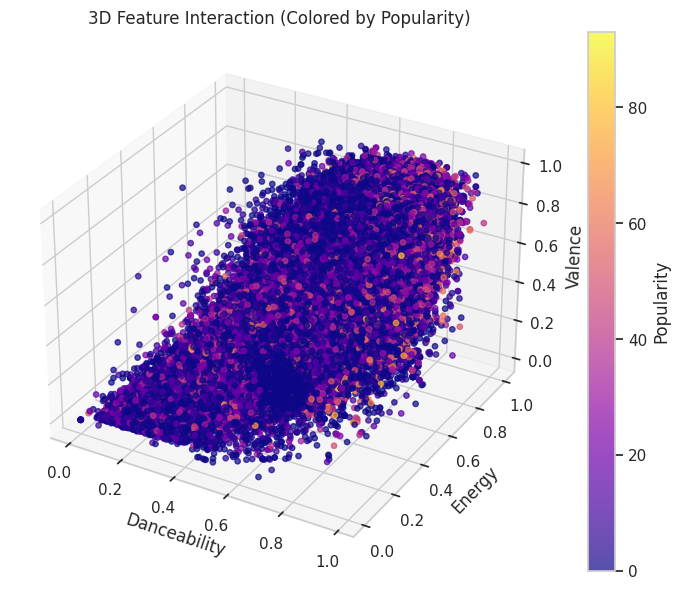

In [17]:
# ============================================================
# 3D Scatter Plot (Danceability, Energy, Valence)
# ============================================================
from mpl_toolkits.mplot3d import Axes3D

df3d = spotify_df[["danceability","energy","valence","popularity"]].dropna()

fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(
    df3d["danceability"],
    df3d["energy"],
    df3d["valence"],
    c=df3d["popularity"],
    cmap="plasma",
    s=15,
    alpha=0.7
)

ax.set_xlabel("Danceability")
ax.set_ylabel("Energy")
ax.set_zlabel("Valence")
plt.title("3D Feature Interaction (Colored by Popularity)")
fig.colorbar(scatter, label="Popularity")

plt.savefig(os.path.join(OUT_DIR, "3D_dance_energy_valence.png"))
plt.show()


8.TIME SERIES ANALYSIS


Column 'is_popular' created automatically (popularity ≥ 50).


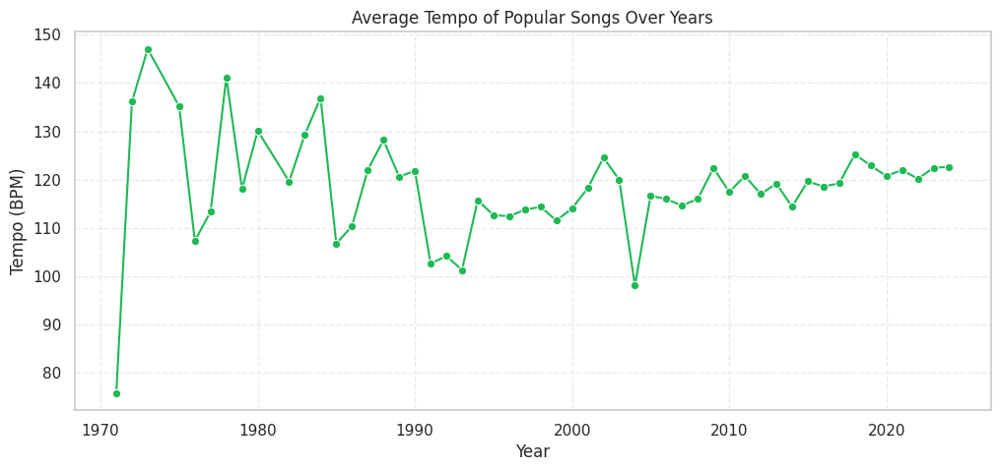

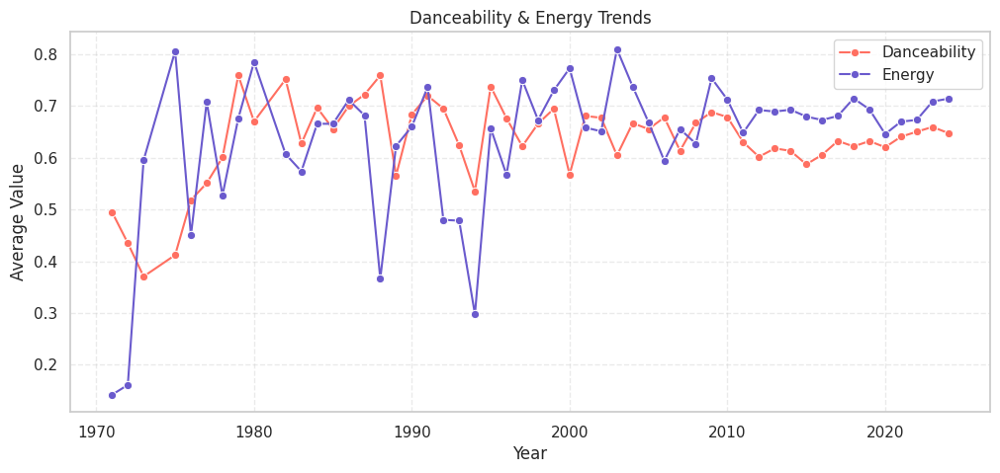

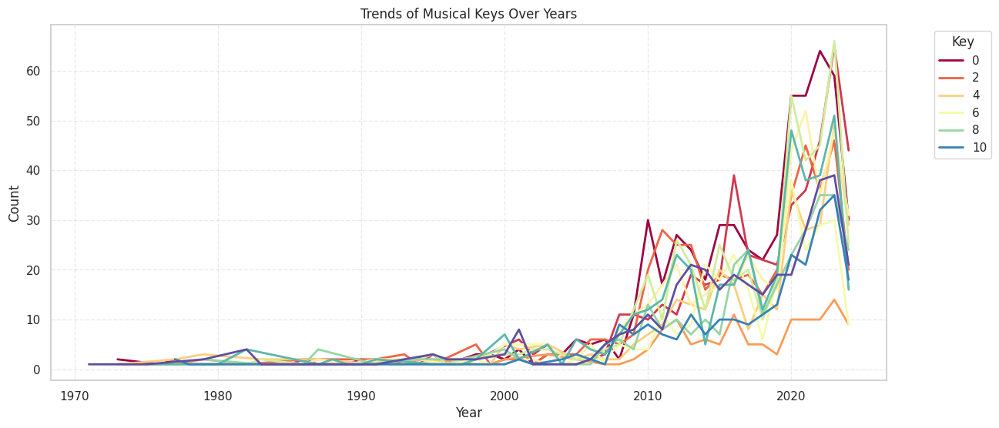

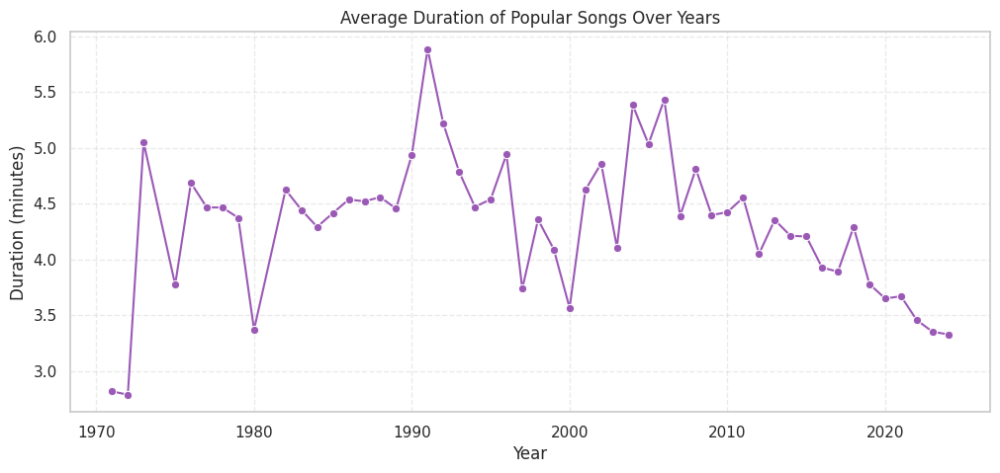

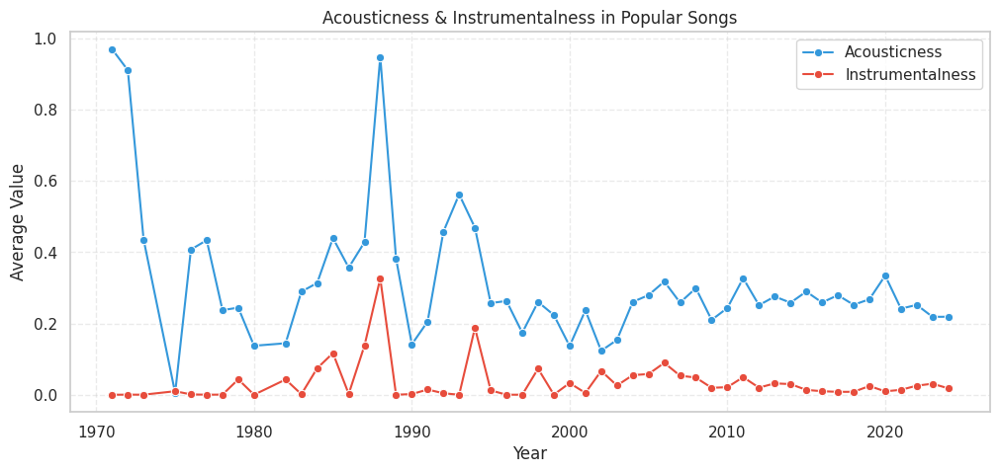

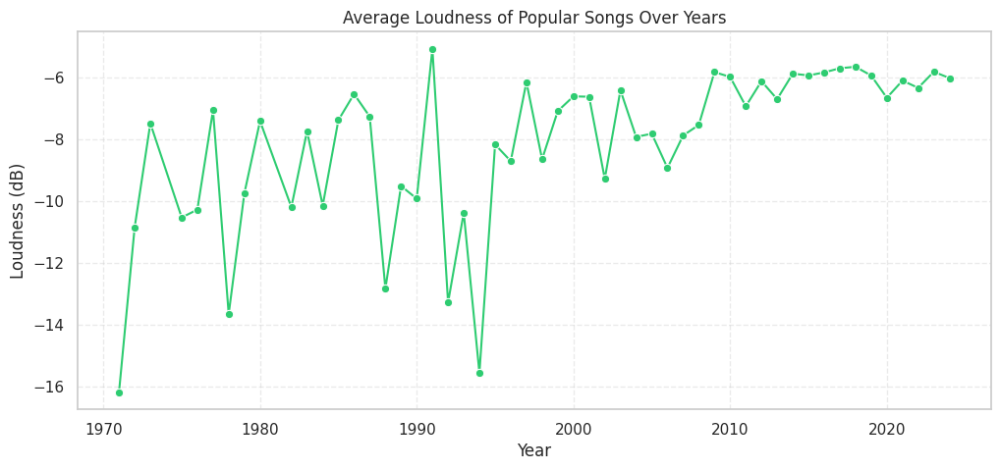

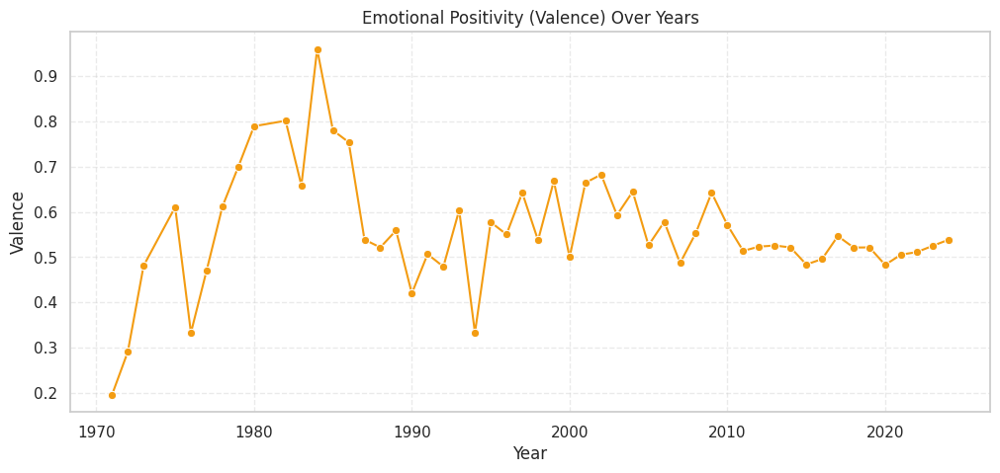


✔ Time-series analysis complete. PNG files saved.


In [7]:
# =====================================================
#             TIME SERIES ANALYSIS
# =====================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid", context="notebook")

# Load dataset
spotify_df = pd.read_csv("spotify_tracks.csv")

# -----------------------------------------------------
# 0. CREATE is_popular if it does not exist
# -----------------------------------------------------
if "is_popular" not in spotify_df.columns:
    if "popularity" in spotify_df.columns:
        spotify_df["is_popular"] = spotify_df["popularity"] >= 50
        print("Column 'is_popular' created automatically (popularity ≥ 50).")
    else:
        raise KeyError("Neither 'is_popular' nor 'popularity' exists in dataset.")

# Filter only popular songs
popular_df = spotify_df[spotify_df["is_popular"] == True].copy()

# -----------------------------------------------------
# 1. TEMPO TREND
# -----------------------------------------------------
tempo_year = popular_df.groupby("year")["tempo"].mean().reset_index()

plt.figure(figsize=(12,5))
sns.lineplot(data=tempo_year, x="year", y="tempo", marker="o", color="#1DB954")
plt.title("Average Tempo of Popular Songs Over Years")
plt.xlabel("Year")
plt.ylabel("Tempo (BPM)")
plt.grid(True, linestyle='--', alpha=0.4)
plt.savefig("Average_Tempo_of_Popular_Songs_Over_Years.png")
plt.show()

# -----------------------------------------------------
# 2. DANCEABILITY & ENERGY TREND
# -----------------------------------------------------
dance_energy_year = popular_df.groupby("year")[["danceability","energy"]].mean().reset_index()

plt.figure(figsize=(12,5))
sns.lineplot(data=dance_energy_year, x="year", y="danceability",
             marker="o", label="Danceability", color="#FF6F61")
sns.lineplot(data=dance_energy_year, x="year", y="energy",
             marker="o", label="Energy", color="#6A5ACD")
plt.title("Danceability & Energy Trends")
plt.xlabel("Year")
plt.ylabel("Average Value")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.4)
plt.savefig("Danceability_Energy_of_Popular_Songs_Over_Years.png")
plt.show()

# -----------------------------------------------------
# 3. KEY TRENDS
# -----------------------------------------------------
key_counts = popular_df.groupby(["year","key"]).size().reset_index(name="count")

plt.figure(figsize=(14,6))
sns.lineplot(data=key_counts, x="year", y="count", hue="key", palette="Spectral", linewidth=2)
plt.title("Trends of Musical Keys Over Years")
plt.xlabel("Year")
plt.ylabel("Count")
plt.legend(title="Key", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.grid(True, linestyle='--', alpha=0.4)
plt.savefig("Trends_of_Musical_Keys_in_Popular_Songs_Over_Years.png")
plt.show()

# -----------------------------------------------------
# 4. DURATION TREND
# -----------------------------------------------------
duration_year = popular_df.groupby("year")["duration_ms"].mean().reset_index()
duration_year["duration_min"] = duration_year["duration_ms"] / 60000

plt.figure(figsize=(12,5))
sns.lineplot(data=duration_year, x="year", y="duration_min",
             marker="o", color="#9B59B6")
plt.title("Average Duration of Popular Songs Over Years")
plt.xlabel("Year")
plt.ylabel("Duration (minutes)")
plt.grid(True, linestyle='--', alpha=0.4)
plt.savefig("Average_Duration_of_Popular_Songs_Over_Years.png")
plt.show()

# -----------------------------------------------------
# 5. ACOUSTICNESS & INSTRUMENTALNESS
# -----------------------------------------------------
acoustic_instr_year = popular_df.groupby("year")[["acousticness","instrumentalness"]].mean().reset_index()

plt.figure(figsize=(12,5))
sns.lineplot(data=acoustic_instr_year, x="year", y="acousticness",
             marker="o", label="Acousticness", color="#3498DB")
sns.lineplot(data=acoustic_instr_year, x="year", y="instrumentalness",
             marker="o", label="Instrumentalness", color="#E74C3C")
plt.title("Acousticness & Instrumentalness in Popular Songs")
plt.xlabel("Year")
plt.ylabel("Average Value")
plt.legend()
plt.grid(True, linestyle='--', alpha=0.4)
plt.savefig("Acousticness_Instrumentalness_Trends_in_Popular_Songs.png")
plt.show()

# -----------------------------------------------------
# 6. LOUDNESS TREND
# -----------------------------------------------------
loudness_year = popular_df.groupby("year")["loudness"].mean().reset_index()

plt.figure(figsize=(12,5))
sns.lineplot(data=loudness_year, x="year", y="loudness",
             marker="o", color="#2ECC71")
plt.title("Average Loudness of Popular Songs Over Years")
plt.xlabel("Year")
plt.ylabel("Loudness (dB)")
plt.grid(True, linestyle='--', alpha=0.4)
plt.savefig("Average_Loudness_Trend.png")
plt.show()

# -----------------------------------------------------
# 7. VALENCE TREND (Happiness score)
# -----------------------------------------------------
valence_year = popular_df.groupby("year")["valence"].mean().reset_index()

plt.figure(figsize=(12,5))
sns.lineplot(data=valence_year, x="year", y="valence",
             marker="o", color="#F39C12")
plt.title("Emotional Positivity (Valence) Over Years")
plt.xlabel("Year")
plt.ylabel("Valence")
plt.grid(True, linestyle='--', alpha=0.4)
plt.savefig("Valence_Trend_Over_Years.png")
plt.show()

print("\n✔ Time-series analysis complete. PNG files saved.")


9.OUTLIER ANALYSIS

In [1]:
# deep_outlier_analysis.py

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from scipy.stats import zscore

sns.set(style="whitegrid", context="talk")

DATA_PATH = "spotify_tracks.csv"
df = pd.read_csv(DATA_PATH)

# Select only numeric columns
num_df = df.select_dtypes(include=[np.number]).copy()
num_cols = num_df.columns.tolist()
print("Numeric Columns:", num_cols)

# Create output path
OUT = "/mnt/data/outlier_analysis_outputs"
import os
os.makedirs(OUT, exist_ok=True)

def savefig(name):
    plt.tight_layout()
    plt.savefig(f"{OUT}/{name}.png", dpi=300, bbox_inches="tight")
    print("Saved:", f"{OUT}/{name}.png")
    plt.show()

# ===============================================================
# 1. IQR METHOD (research style)
# ===============================================================
outlier_summary = []

for col in num_cols:
    s = num_df[col].dropna()
    Q1, Q3 = s.quantile(0.25), s.quantile(0.75)
    IQR = Q3 - Q1
    lower, upper = Q1 - 1.5 * IQR, Q3 + 1.5 * IQR
    outliers = s[(s < lower) | (s > upper)]
    outlier_summary.append((col, len(outliers), lower, upper))

iqr_df = pd.DataFrame(outlier_summary,
                      columns=["Variable","Num_Outliers_IQR","Lower_Bound","Upper_Bound"])
print("\n==== IQR OUTLIER SUMMARY ====\n")
print(iqr_df)
iqr_df.to_csv(f"{OUT}/IQR_outlier_summary.csv", index=False)








Numeric Columns: ['year', 'popularity', 'acousticness', 'danceability', 'duration_ms', 'energy', 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'speechiness', 'tempo', 'time_signature', 'valence']

==== IQR OUTLIER SUMMARY ====

            Variable  Num_Outliers_IQR  Lower_Bound   Upper_Bound
0               year              4072   1994.50000    2038.50000
1         popularity              1115    -39.00000      65.00000
2       acousticness                35     -0.78025       1.47935
3       danceability              1277      0.14750       1.07950
4        duration_ms              2273  51040.00000  427360.00000
5             energy                35     -0.10450       1.34750
6   instrumentalness             14234     -0.02280       0.03800
7                key                 0     -7.00000      17.00000
8           liveness              4223     -0.13150       0.46770
9           loudness              4049    -18.63350       2.45050
10              mode             

In [2]:
# ===============================================================
# 2. Z-SCORE METHOD
# ===============================================================
zscore_summary = []
for col in num_cols:
    s = num_df[col].dropna()
    z = np.abs(zscore(s, nan_policy='omit'))
    num_outliers = np.sum(z > 3)
    zscore_summary.append((col, int(num_outliers)))

z_df = pd.DataFrame(zscore_summary, columns=["Variable","Num_Outliers_ZScore"])
z_df.to_csv(f"{OUT}/ZScore_outlier_summary.csv", index=False)
print("\n==== Z-SCORE OUTLIER SUMMARY ====\n")
print(z_df)





==== Z-SCORE OUTLIER SUMMARY ====

            Variable  Num_Outliers_ZScore
0               year                 1098
1         popularity                  483
2       acousticness                   35
3       danceability                   58
4        duration_ms                  417
5             energy                   35
6   instrumentalness                   35
7                key                    0
8           liveness                 1696
9           loudness                   35
10              mode                   35
11       speechiness                 1120
12             tempo                  130
13    time_signature                  914
14           valence                   35


In [3]:
# ===============================================================
# 3. MODIFIED Z-SCORE (MAD method)
# ===============================================================
def modified_z(x):
    median = np.median(x)
    mad = np.median(np.abs(x - median))
    return 0.6745 * (x - median) / mad if mad != 0 else np.zeros(len(x))

mad_summary = []
for col in num_cols:
    s = num_df[col].dropna()
    mz = np.abs(modified_z(s))
    num_outliers = np.sum(mz > 3.5)    # conservative threshold
    mad_summary.append((col, num_outliers))

mad_df = pd.DataFrame(mad_summary, columns=["Variable","Num_Outliers_ModZ"])
mad_df.to_csv(f"{OUT}/ModifiedZ_outlier_summary.csv", index=False)
print("\n==== MODIFIED Z-SCORE OUTLIER SUMMARY ====\n")
print(mad_df)


==== MODIFIED Z-SCORE OUTLIER SUMMARY ====

            Variable  Num_Outliers_ModZ
0               year               2779
1         popularity               6617
2       acousticness                 35
3       danceability                 58
4        duration_ms                865
5             energy                 35
6   instrumentalness              25854
7                key                  0
8           liveness               7325
9           loudness               3164
10              mode                  0
11       speechiness               9788
12             tempo                 63
13    time_signature                  0
14           valence                 35


In [4]:
# ===============================================================
# 4. ISOLATION FOREST (ML-Based)
# ===============================================================
iso = IsolationForest(contamination=0.03, random_state=42)
iso_labels = iso.fit_predict(num_df.fillna(0))
df["isoforest_outlier"] = (iso_labels == -1).astype(int)
print("\nIsolation Forest Outliers:", df["isoforest_outlier"].sum())

df["isoforest_outlier"].to_csv(f"{OUT}/IsolationForest_outliers.csv", index=False)




Isolation Forest Outliers: 1870


In [5]:
# ===============================================================
# 5. LOCAL OUTLIER FACTOR (LOF)
# ===============================================================
lof = LocalOutlierFactor(n_neighbors=20, contamination=0.03)
lof_labels = lof.fit_predict(num_df.fillna(0))
df["lof_outlier"] = (lof_labels == -1).astype(int)

print("Local Outlier Factor Outliers:", df["lof_outlier"].sum())
df["lof_outlier"].to_csv(f"{OUT}/LOF_outliers.csv", index=False)

Local Outlier Factor Outliers: 1870


/usr/local/lib/python3.12/dist-packages/sklearn/neighbors/_lof.py:322: UserWarning: Duplicate values are leading to incorrect results. Increase the number of neighbors for more accurate results.
  warnings.warn(


In [6]:
# ===============================================================
# 6. Percentile-based Extreme Detection
# ===============================================================
perc_summary = []
for col in num_cols:
    s = num_df[col].dropna()
    lower = s.quantile(0.01)
    upper = s.quantile(0.99)
    num_outliers = np.sum((s < lower) | (s > upper))
    perc_summary.append((col, num_outliers))

perc_df = pd.DataFrame(perc_summary, columns=["Variable","Num_Outliers_Percentile"])
perc_df.to_csv(f"{OUT}/Percentile_outliers_summary.csv", index=False)
print("\n==== PERCENTILE OUTLIER SUMMARY ====\n")
print(perc_df)





==== PERCENTILE OUTLIER SUMMARY ====

            Variable  Num_Outliers_Percentile
0               year                      453
1         popularity                      556
2       acousticness                     1208
3       danceability                     1241
4        duration_ms                     1248
5             energy                     1213
6   instrumentalness                      619
7                key                       35
8           liveness                     1245
9           loudness                     1247
10              mode                       35
11       speechiness                     1238
12             tempo                     1215
13    time_signature                       58
14           valence                     1217


Plotting year (sample size = 5000)
Saved: /mnt/data/outlier_analysis_outputs/hist_kde_year.png


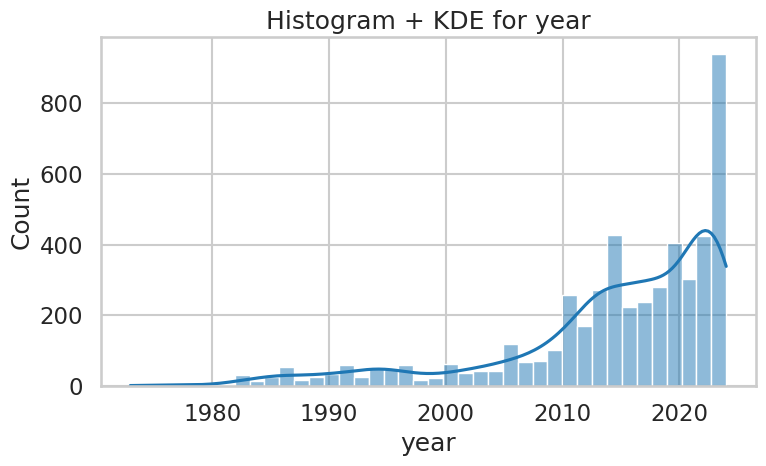

Saved: /mnt/data/outlier_analysis_outputs/outlier_hist_year.png


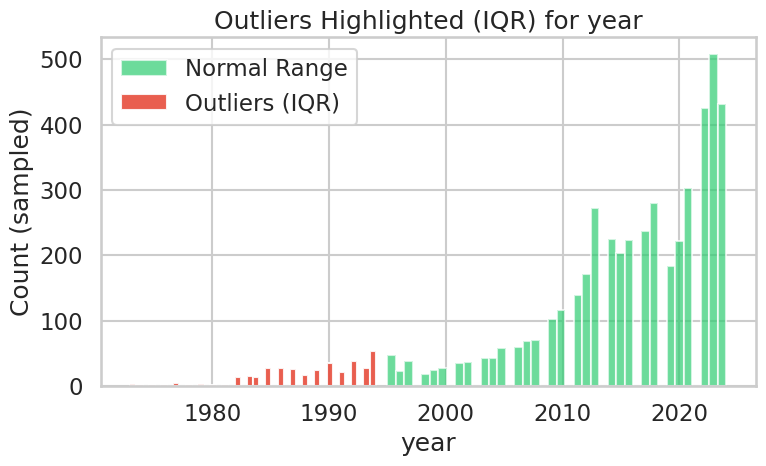

Saved: /mnt/data/outlier_analysis_outputs/boxplot_year.png


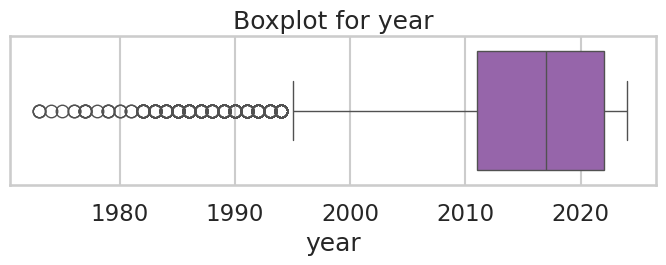

Saved: /mnt/data/outlier_analysis_outputs/violin_year.png


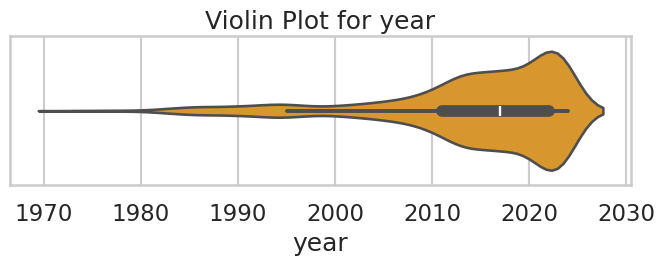

Saved: /mnt/data/outlier_analysis_outputs/before_after_year.png


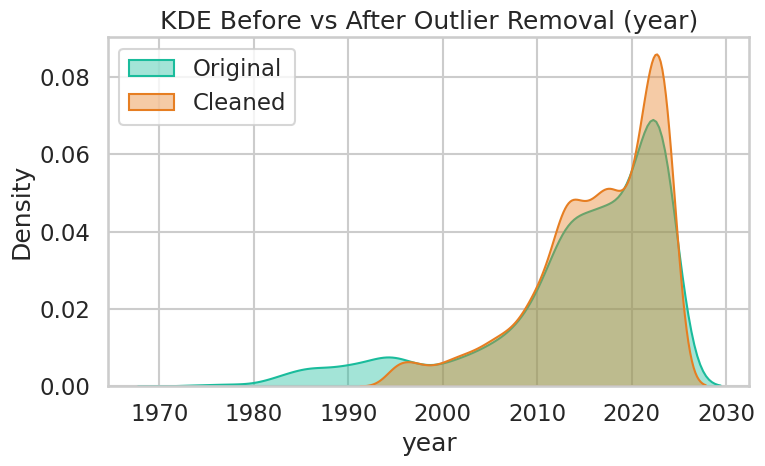

Plotting popularity (sample size = 5000)
Saved: /mnt/data/outlier_analysis_outputs/hist_kde_popularity.png


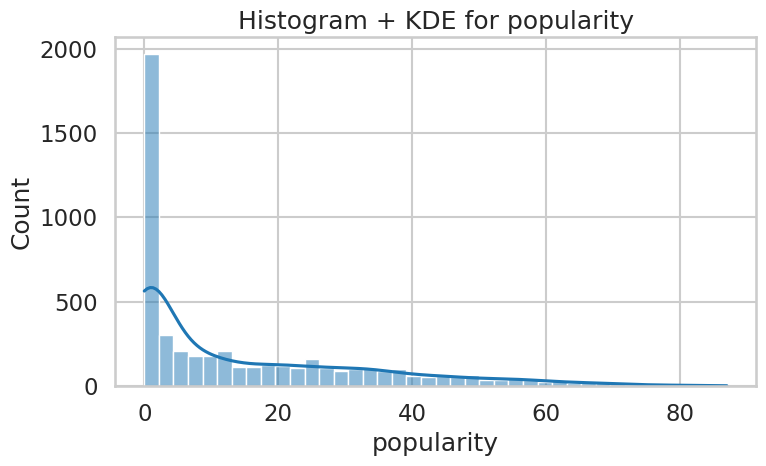

Saved: /mnt/data/outlier_analysis_outputs/outlier_hist_popularity.png


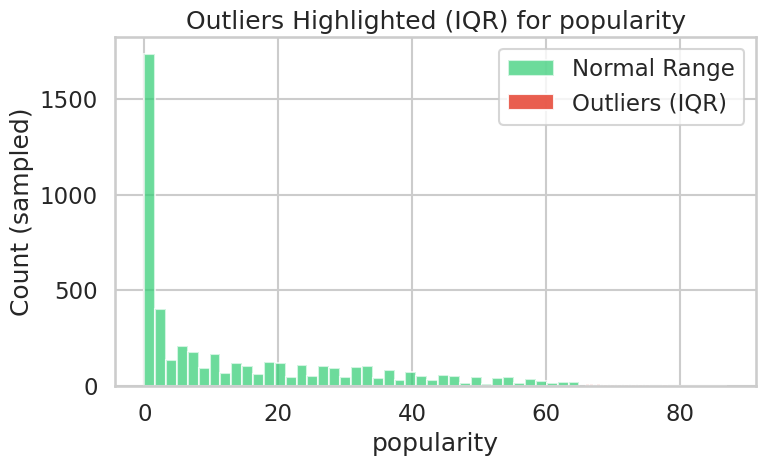

Saved: /mnt/data/outlier_analysis_outputs/boxplot_popularity.png


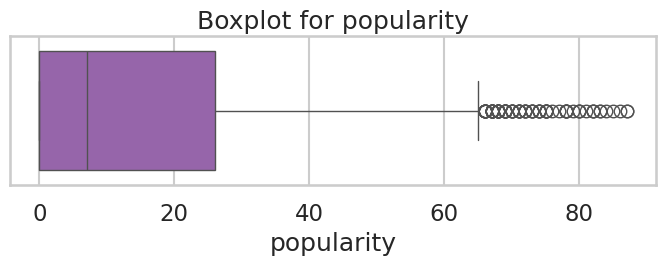

Saved: /mnt/data/outlier_analysis_outputs/violin_popularity.png


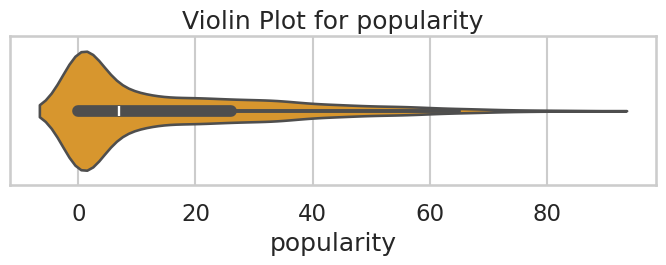

Saved: /mnt/data/outlier_analysis_outputs/before_after_popularity.png


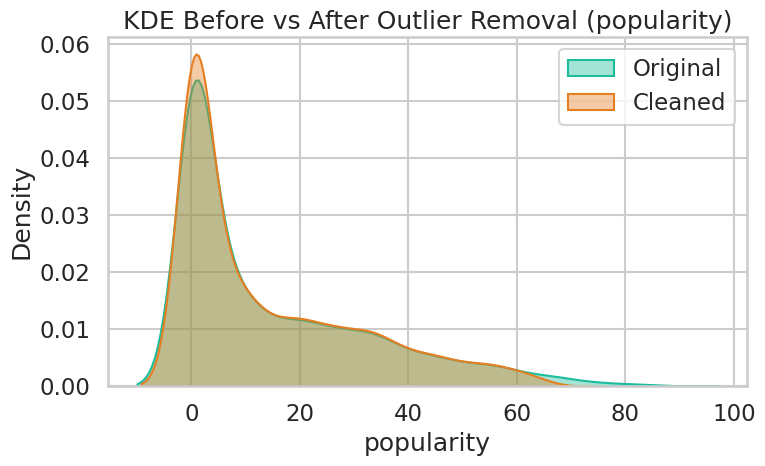

Plotting acousticness (sample size = 5000)
Saved: /mnt/data/outlier_analysis_outputs/hist_kde_acousticness.png


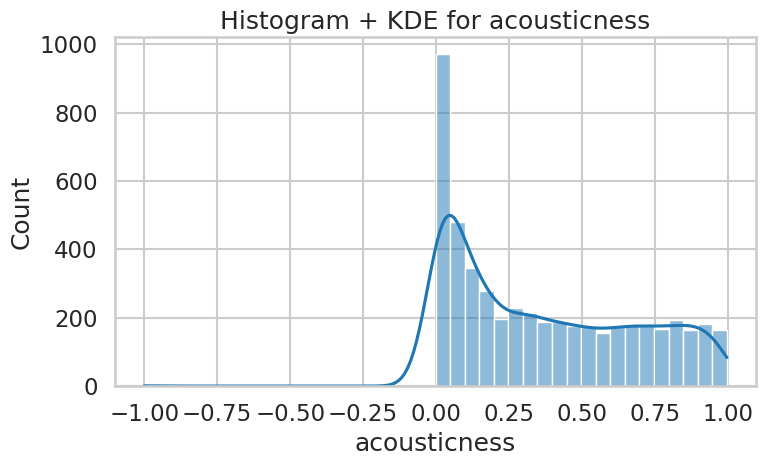

Saved: /mnt/data/outlier_analysis_outputs/outlier_hist_acousticness.png


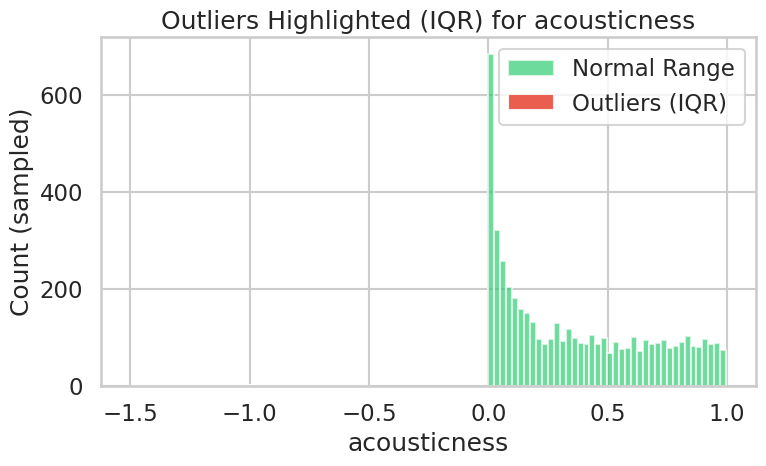

Saved: /mnt/data/outlier_analysis_outputs/boxplot_acousticness.png


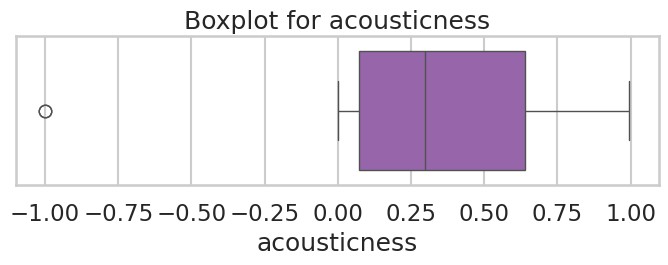

Saved: /mnt/data/outlier_analysis_outputs/violin_acousticness.png


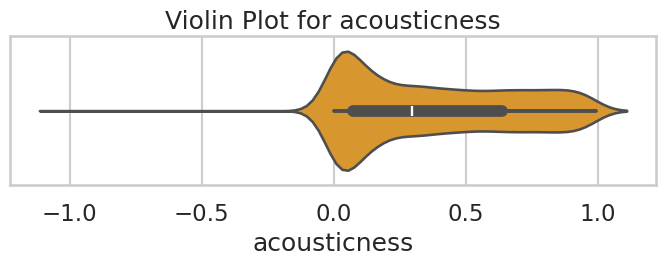

Saved: /mnt/data/outlier_analysis_outputs/before_after_acousticness.png


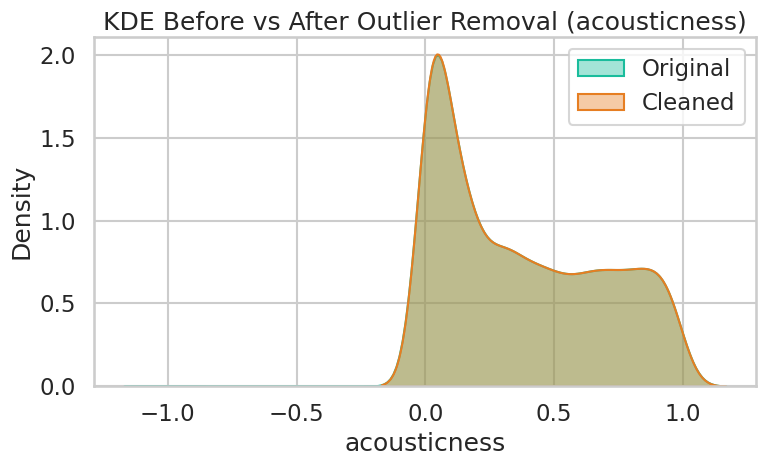

Plotting danceability (sample size = 5000)
Saved: /mnt/data/outlier_analysis_outputs/hist_kde_danceability.png


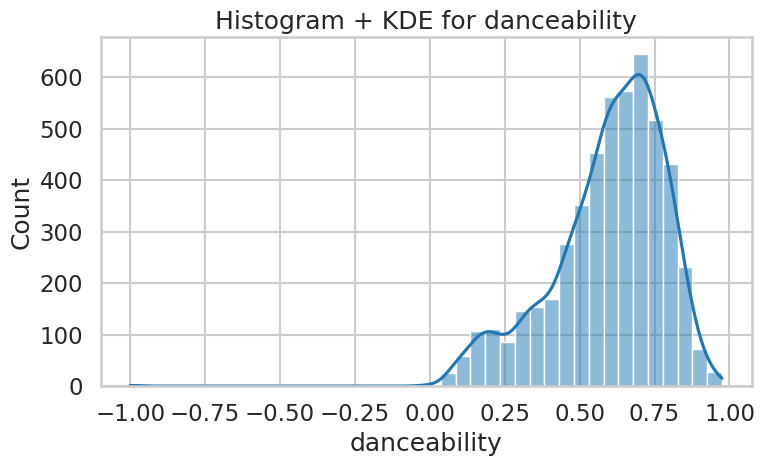

Saved: /mnt/data/outlier_analysis_outputs/outlier_hist_danceability.png


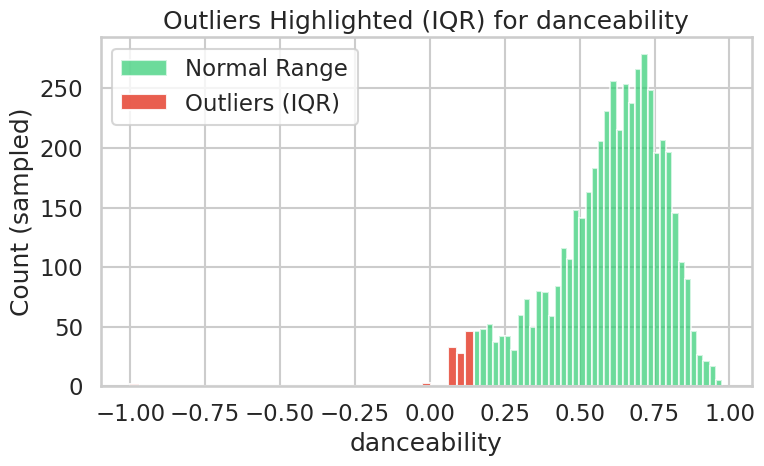

Saved: /mnt/data/outlier_analysis_outputs/boxplot_danceability.png


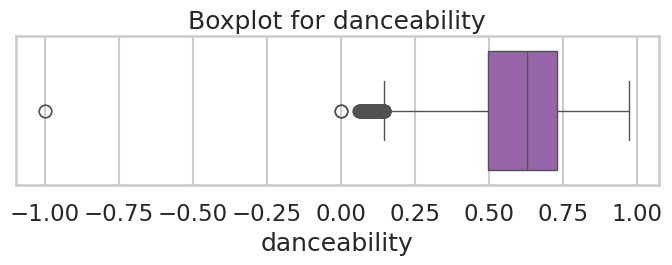

Saved: /mnt/data/outlier_analysis_outputs/violin_danceability.png


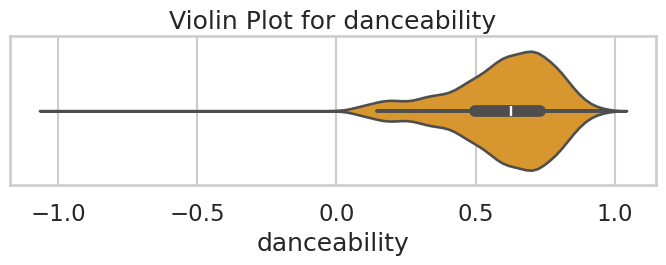

Saved: /mnt/data/outlier_analysis_outputs/before_after_danceability.png


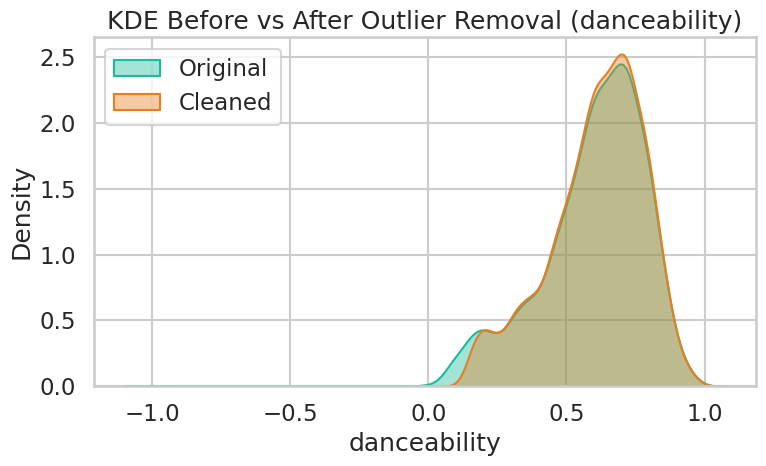

Plotting duration_ms (sample size = 5000)
Saved: /mnt/data/outlier_analysis_outputs/hist_kde_duration_ms.png


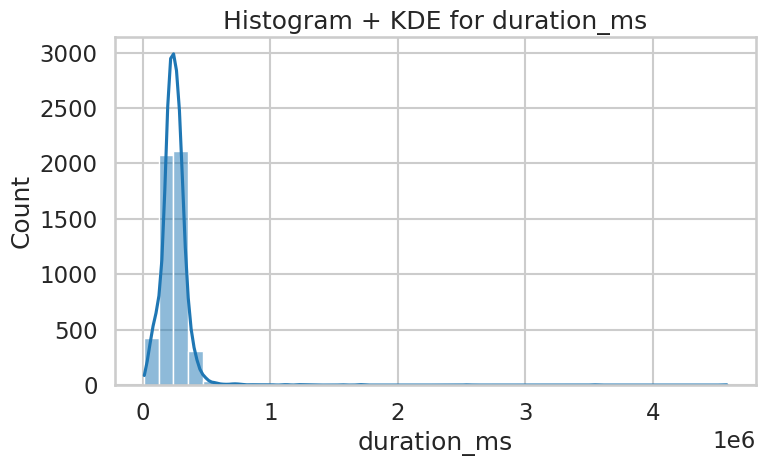

Saved: /mnt/data/outlier_analysis_outputs/outlier_hist_duration_ms.png


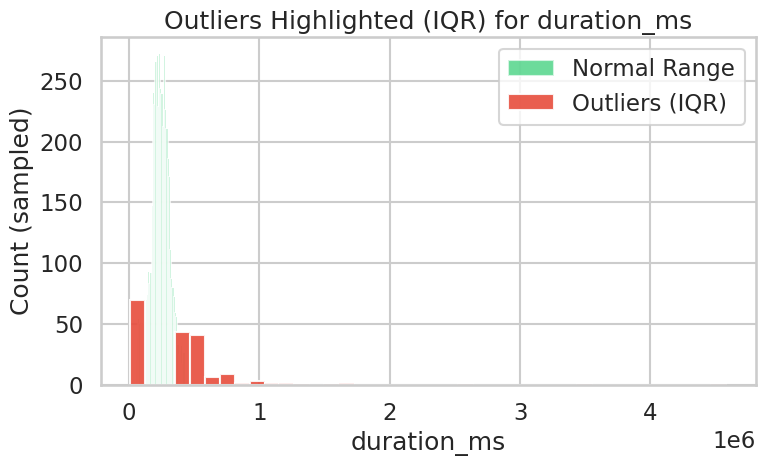

Saved: /mnt/data/outlier_analysis_outputs/boxplot_duration_ms.png


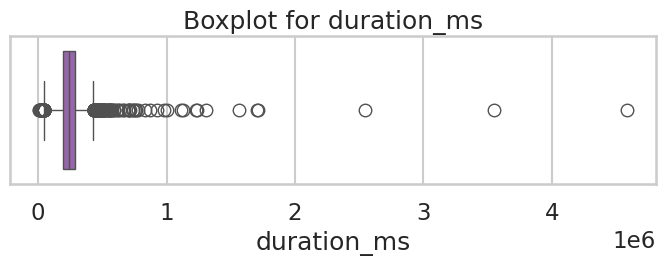

Saved: /mnt/data/outlier_analysis_outputs/violin_duration_ms.png


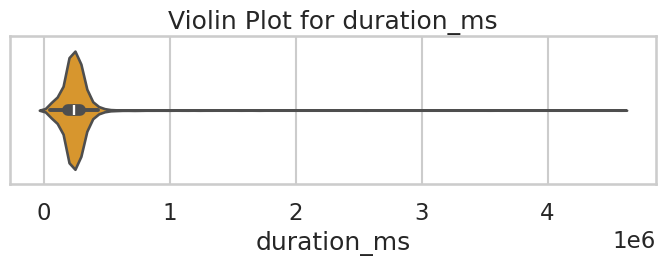

Saved: /mnt/data/outlier_analysis_outputs/before_after_duration_ms.png


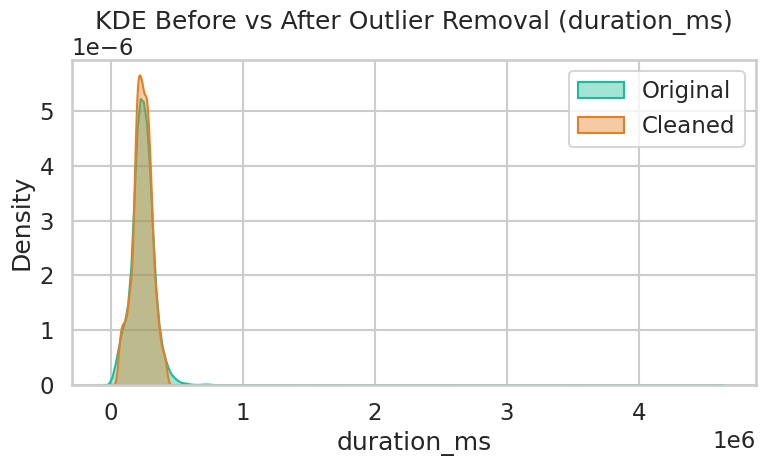

Plotting energy (sample size = 5000)
Saved: /mnt/data/outlier_analysis_outputs/hist_kde_energy.png


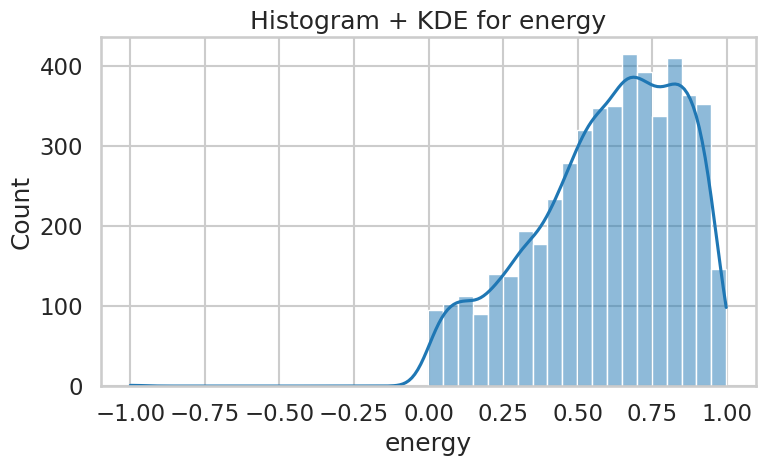

Saved: /mnt/data/outlier_analysis_outputs/outlier_hist_energy.png


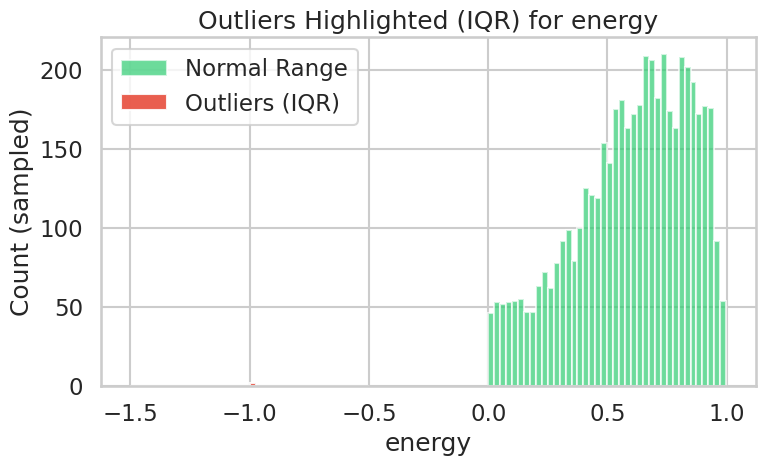

Saved: /mnt/data/outlier_analysis_outputs/boxplot_energy.png


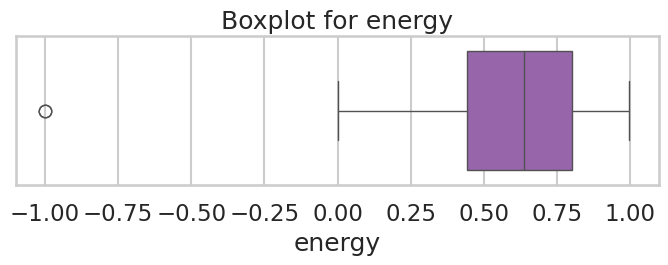

Saved: /mnt/data/outlier_analysis_outputs/violin_energy.png


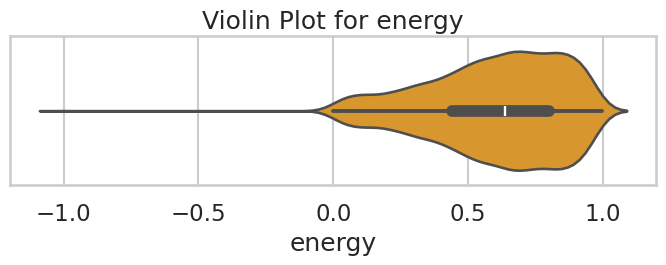

Saved: /mnt/data/outlier_analysis_outputs/before_after_energy.png


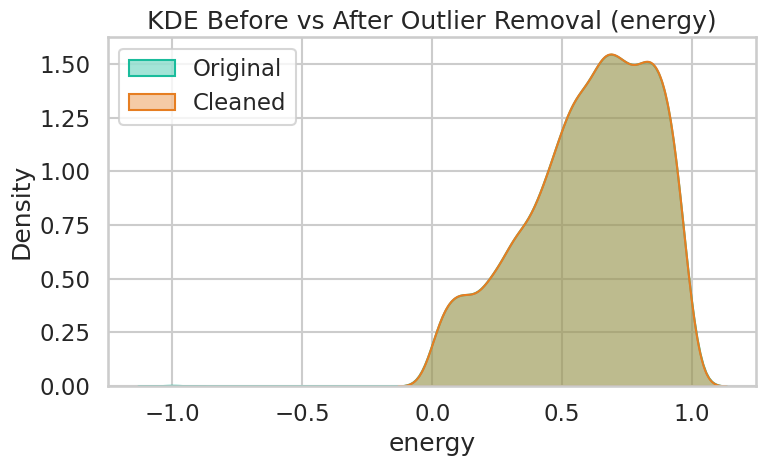

Plotting instrumentalness (sample size = 5000)
Saved: /mnt/data/outlier_analysis_outputs/hist_kde_instrumentalness.png


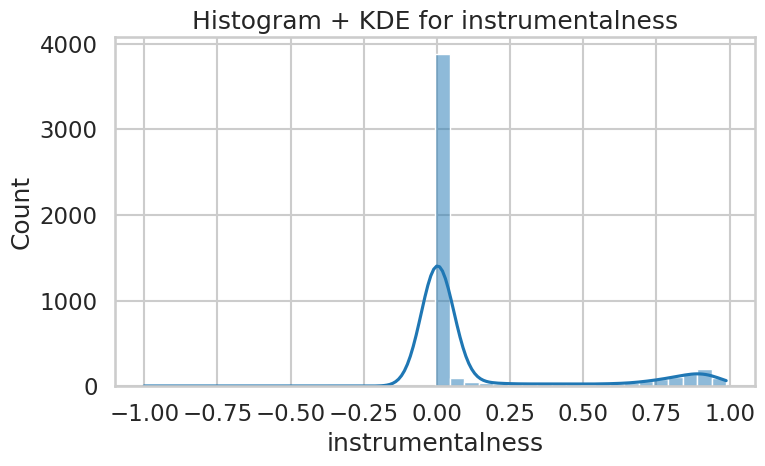

Saved: /mnt/data/outlier_analysis_outputs/outlier_hist_instrumentalness.png


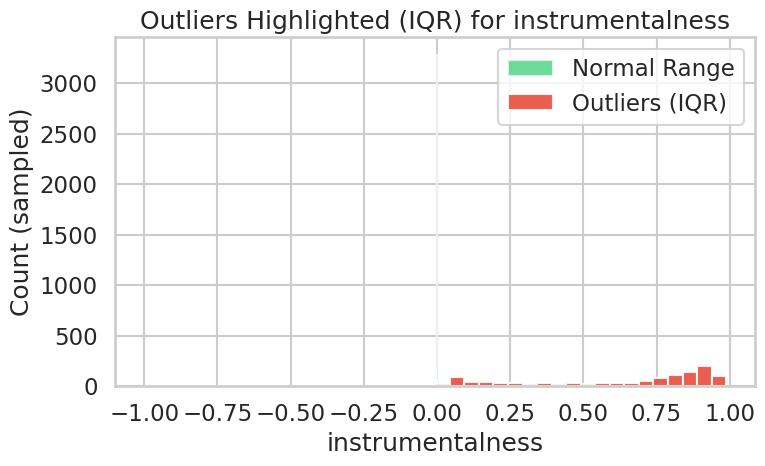

Saved: /mnt/data/outlier_analysis_outputs/boxplot_instrumentalness.png


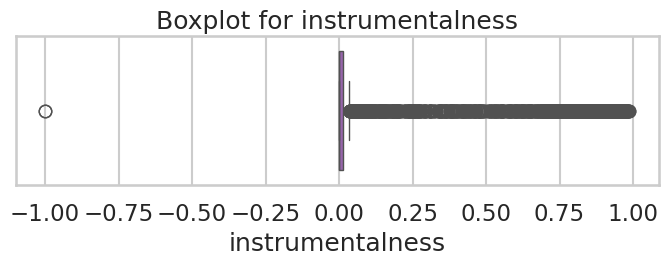

Saved: /mnt/data/outlier_analysis_outputs/violin_instrumentalness.png


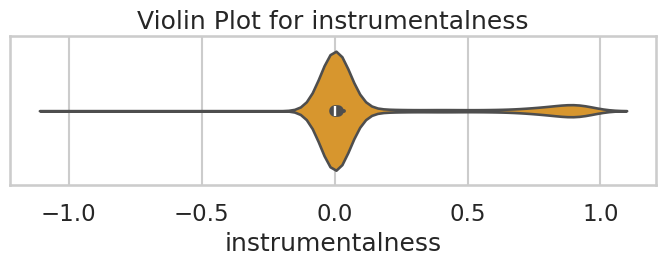

Saved: /mnt/data/outlier_analysis_outputs/before_after_instrumentalness.png


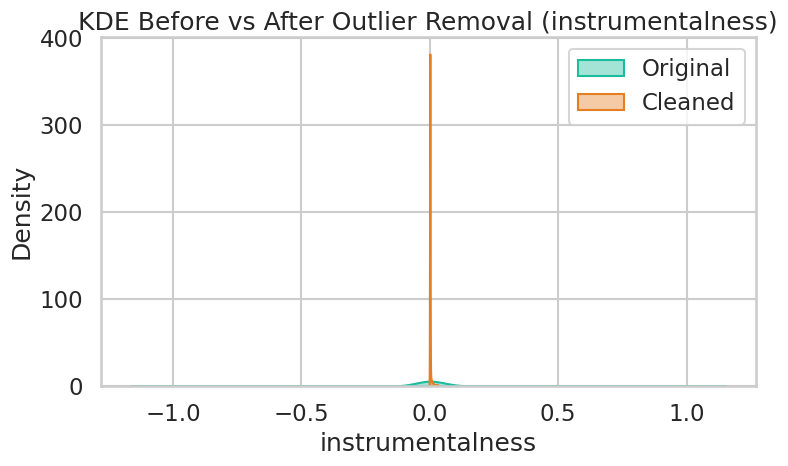

Plotting key (sample size = 5000)
Saved: /mnt/data/outlier_analysis_outputs/hist_kde_key.png


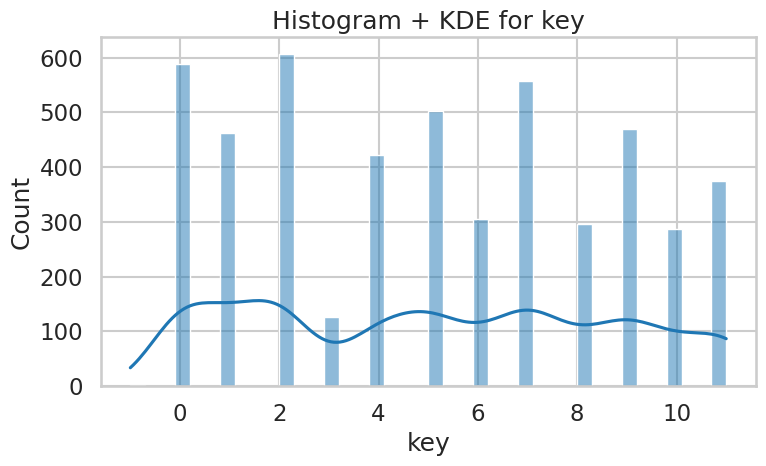

Saved: /mnt/data/outlier_analysis_outputs/outlier_hist_key.png


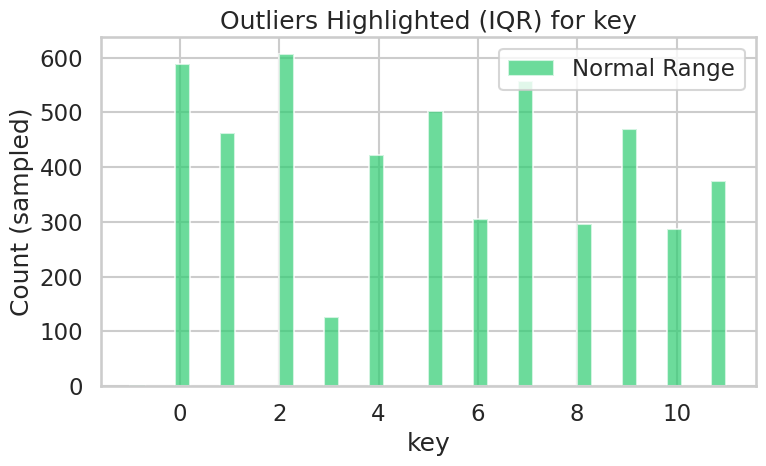

Saved: /mnt/data/outlier_analysis_outputs/boxplot_key.png


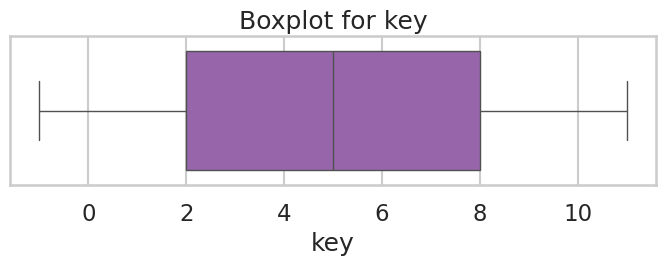

Saved: /mnt/data/outlier_analysis_outputs/violin_key.png


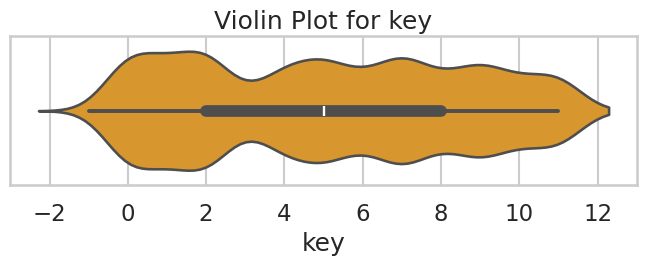

Saved: /mnt/data/outlier_analysis_outputs/before_after_key.png


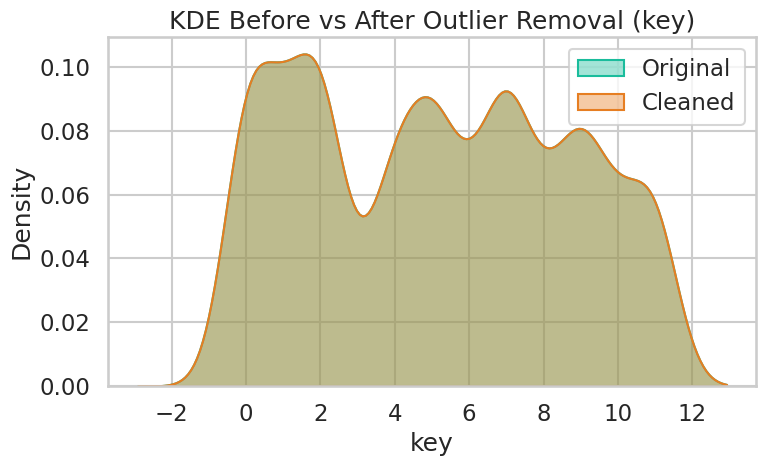

Plotting liveness (sample size = 5000)
Saved: /mnt/data/outlier_analysis_outputs/hist_kde_liveness.png


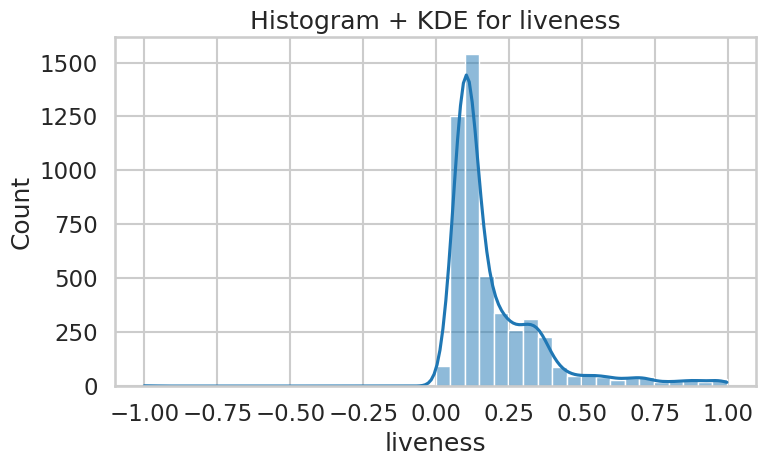

Saved: /mnt/data/outlier_analysis_outputs/outlier_hist_liveness.png


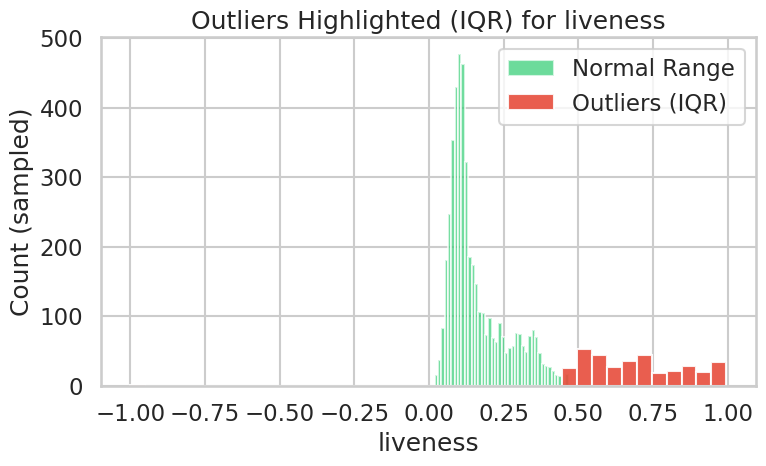

Saved: /mnt/data/outlier_analysis_outputs/boxplot_liveness.png


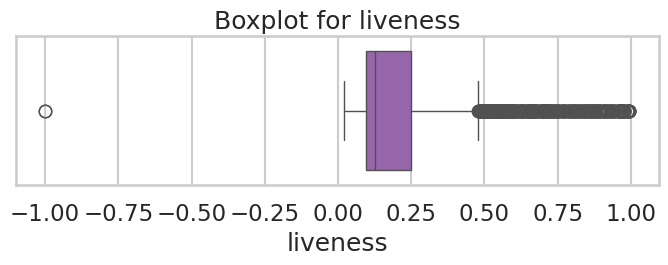

Saved: /mnt/data/outlier_analysis_outputs/violin_liveness.png


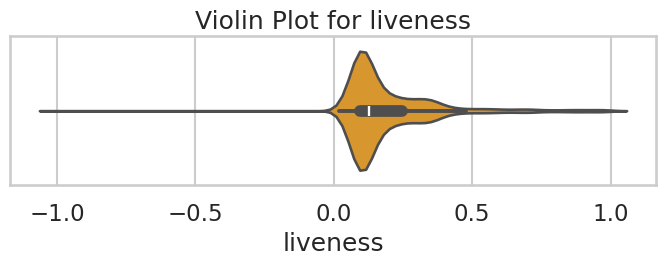

Saved: /mnt/data/outlier_analysis_outputs/before_after_liveness.png


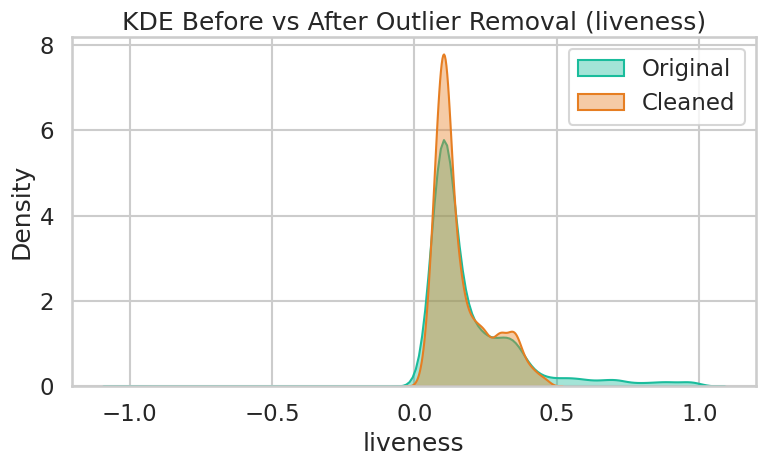

Plotting loudness (sample size = 5000)
Saved: /mnt/data/outlier_analysis_outputs/hist_kde_loudness.png


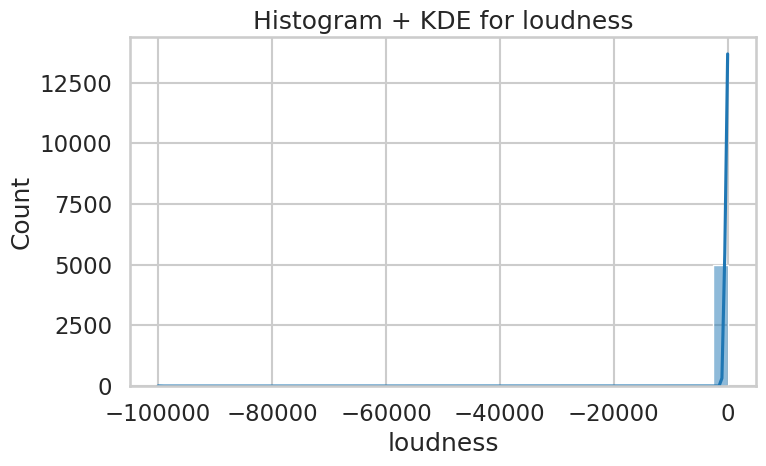

Saved: /mnt/data/outlier_analysis_outputs/outlier_hist_loudness.png


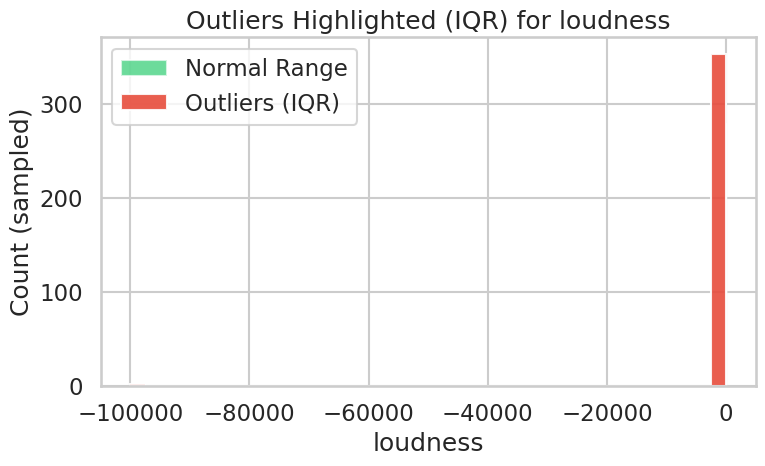

Saved: /mnt/data/outlier_analysis_outputs/boxplot_loudness.png


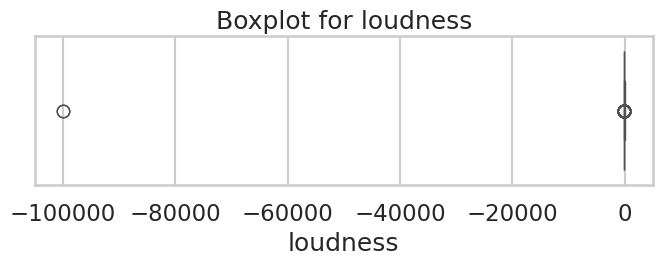

Saved: /mnt/data/outlier_analysis_outputs/violin_loudness.png


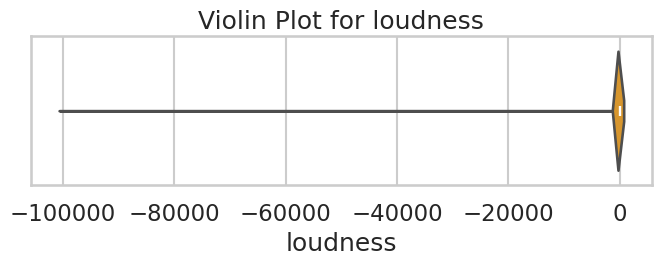

Saved: /mnt/data/outlier_analysis_outputs/before_after_loudness.png


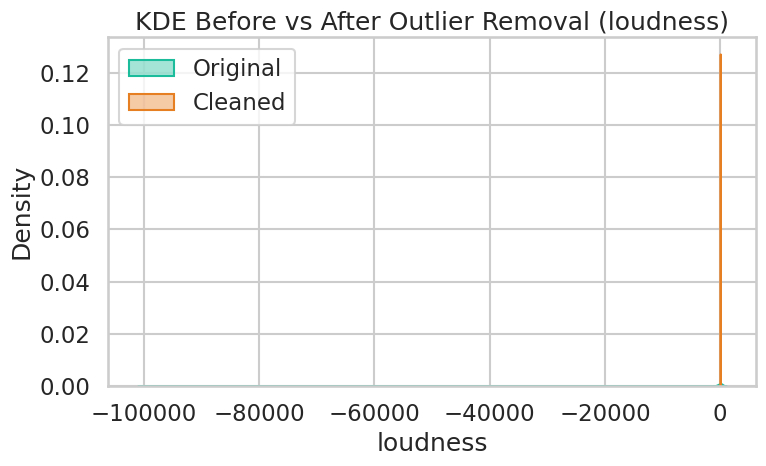

Plotting mode (sample size = 5000)
Saved: /mnt/data/outlier_analysis_outputs/hist_kde_mode.png


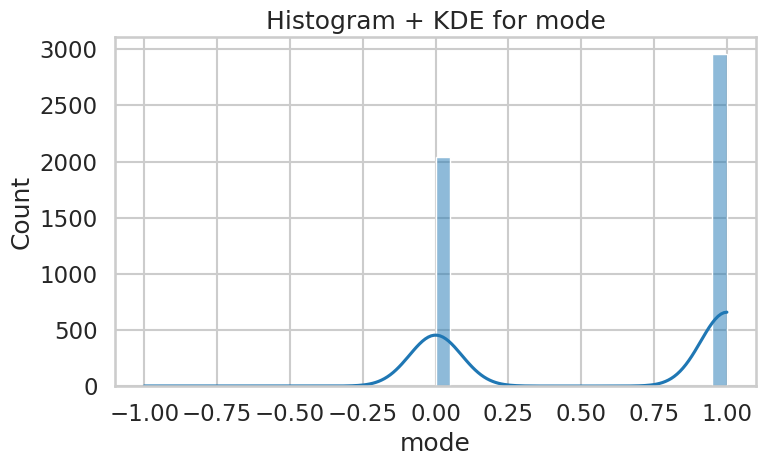

Saved: /mnt/data/outlier_analysis_outputs/outlier_hist_mode.png


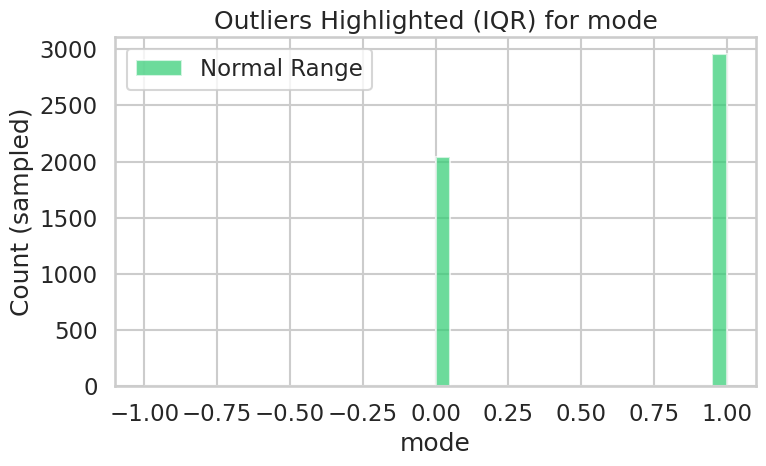

Saved: /mnt/data/outlier_analysis_outputs/boxplot_mode.png


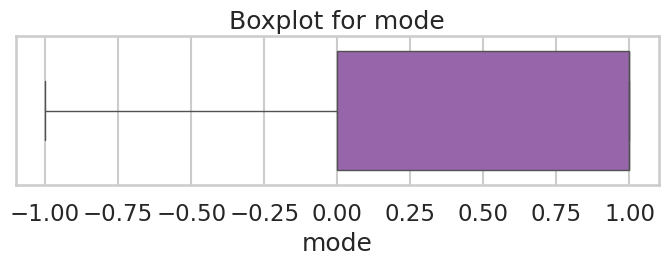

Saved: /mnt/data/outlier_analysis_outputs/violin_mode.png


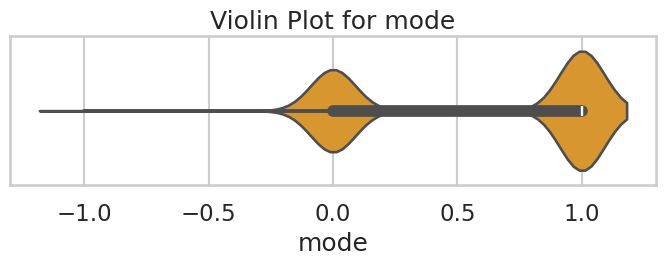

Saved: /mnt/data/outlier_analysis_outputs/before_after_mode.png


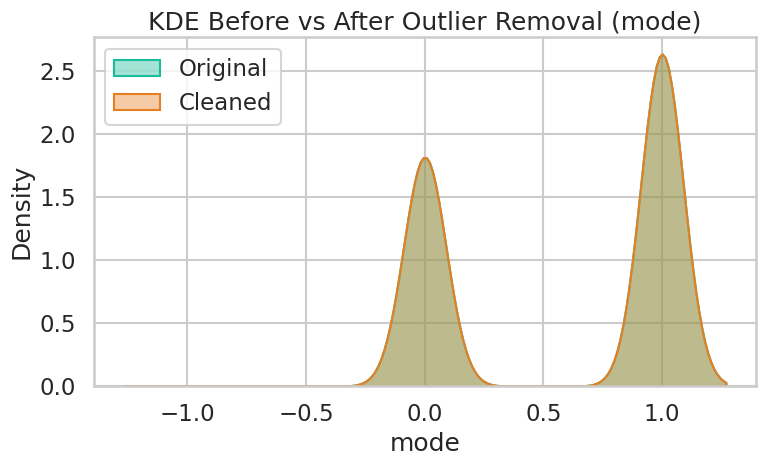

Plotting speechiness (sample size = 5000)
Saved: /mnt/data/outlier_analysis_outputs/hist_kde_speechiness.png


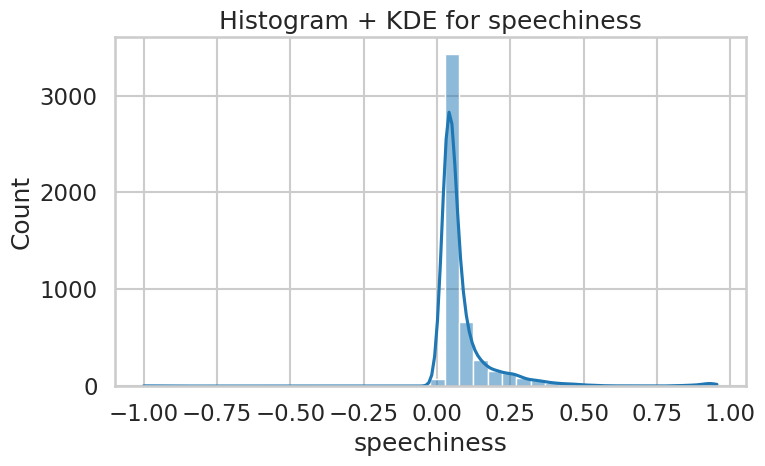

Saved: /mnt/data/outlier_analysis_outputs/outlier_hist_speechiness.png


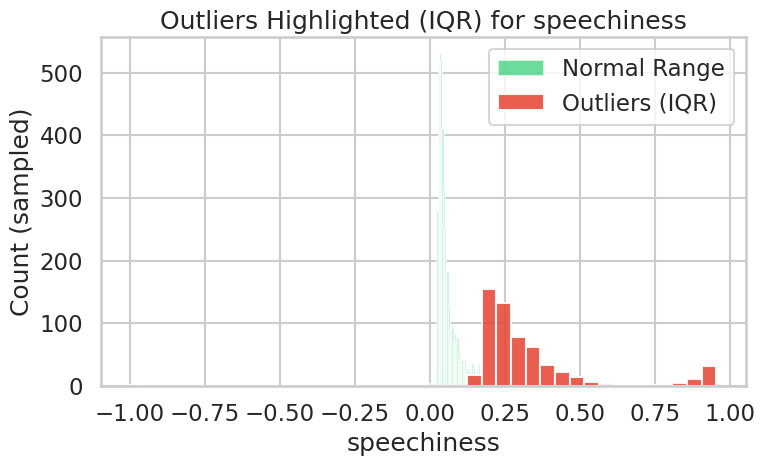

Saved: /mnt/data/outlier_analysis_outputs/boxplot_speechiness.png


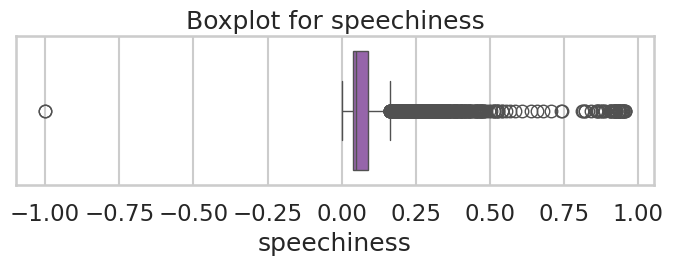

Saved: /mnt/data/outlier_analysis_outputs/violin_speechiness.png


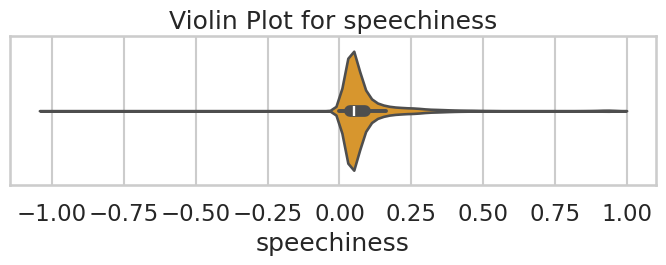

Saved: /mnt/data/outlier_analysis_outputs/before_after_speechiness.png


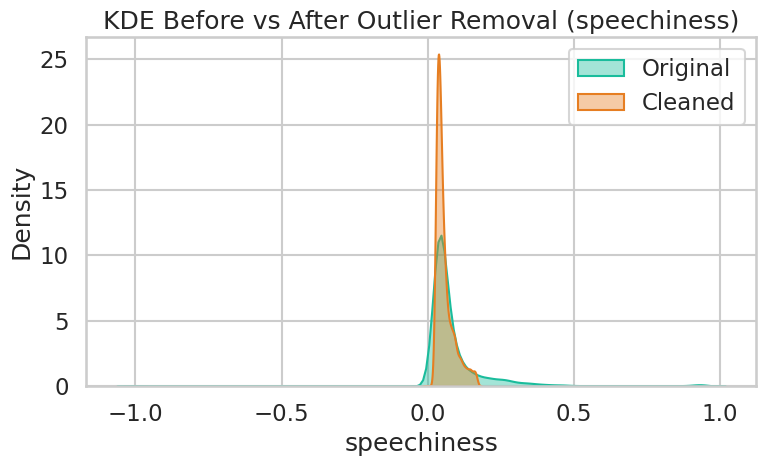

Plotting tempo (sample size = 5000)
Saved: /mnt/data/outlier_analysis_outputs/hist_kde_tempo.png


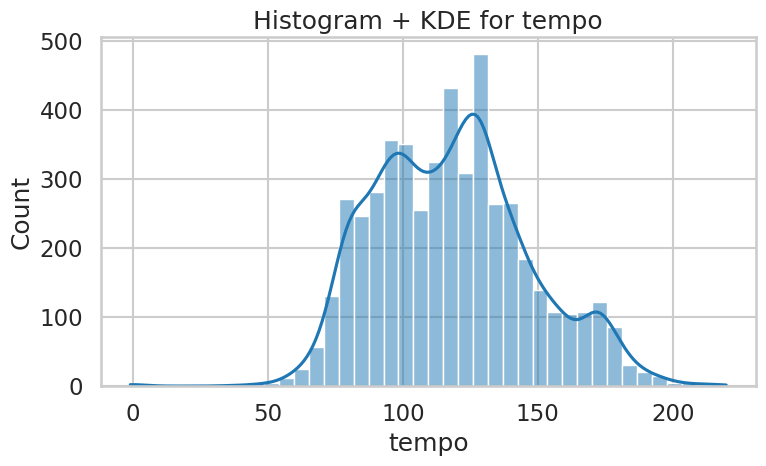

Saved: /mnt/data/outlier_analysis_outputs/outlier_hist_tempo.png


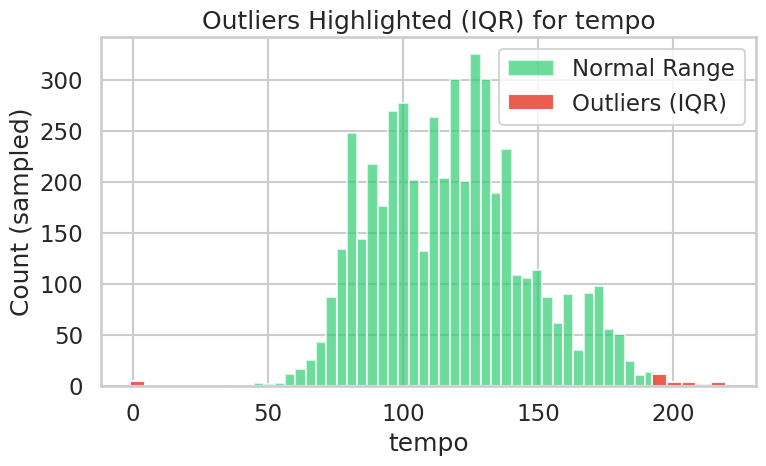

Saved: /mnt/data/outlier_analysis_outputs/boxplot_tempo.png


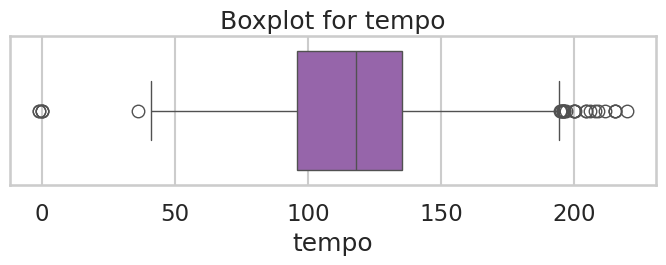

Saved: /mnt/data/outlier_analysis_outputs/violin_tempo.png


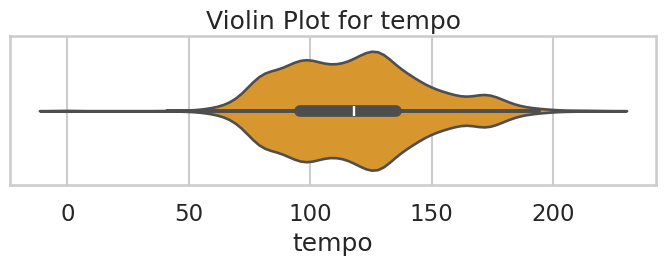

Saved: /mnt/data/outlier_analysis_outputs/before_after_tempo.png


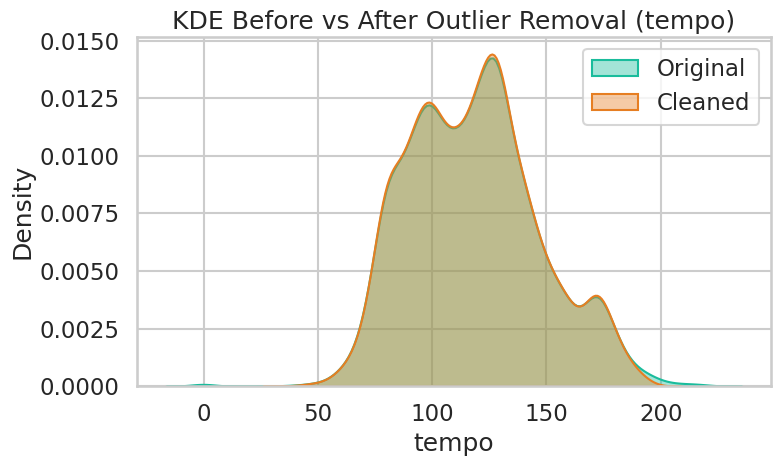

Plotting time_signature (sample size = 5000)
Saved: /mnt/data/outlier_analysis_outputs/hist_kde_time_signature.png


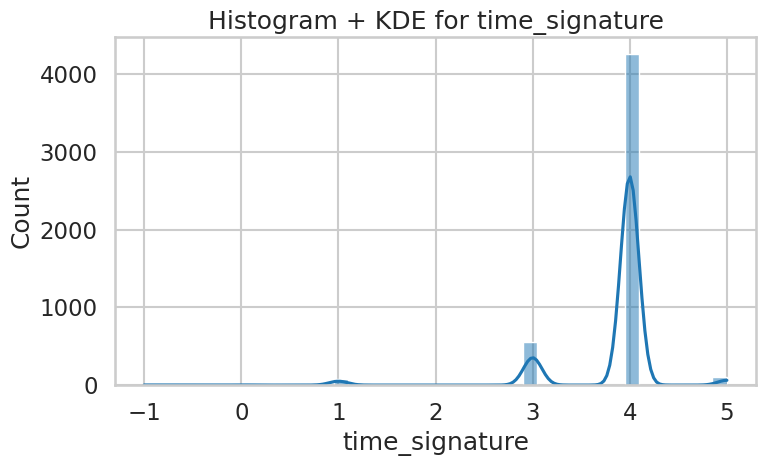

Saved: /mnt/data/outlier_analysis_outputs/outlier_hist_time_signature.png


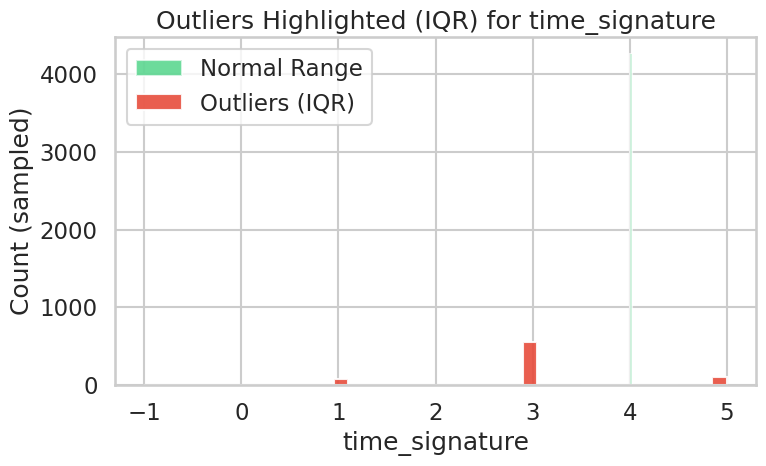

Saved: /mnt/data/outlier_analysis_outputs/boxplot_time_signature.png


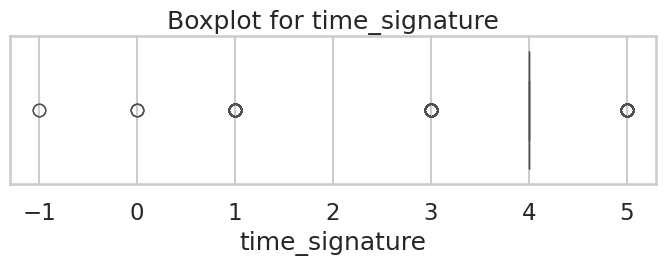

Saved: /mnt/data/outlier_analysis_outputs/violin_time_signature.png


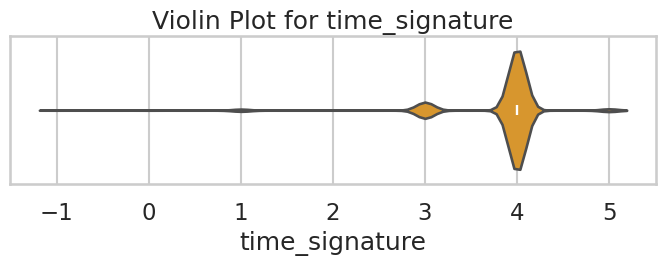

/tmp/ipython-input-164348736.py:86: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(cleaned_sample, fill=True, alpha=0.4, label="Cleaned", color="#e67e22")


Saved: /mnt/data/outlier_analysis_outputs/before_after_time_signature.png


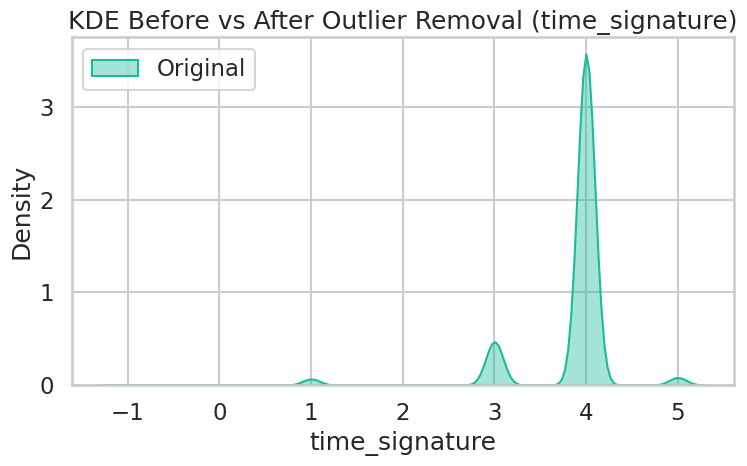

Plotting valence (sample size = 5000)
Saved: /mnt/data/outlier_analysis_outputs/hist_kde_valence.png


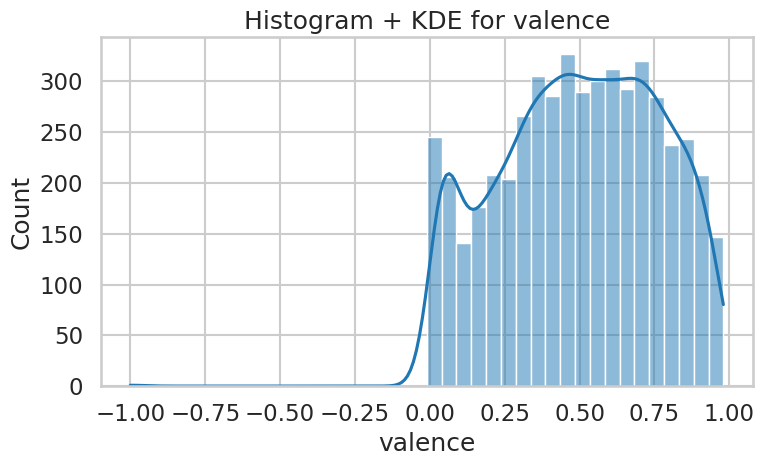

Saved: /mnt/data/outlier_analysis_outputs/outlier_hist_valence.png


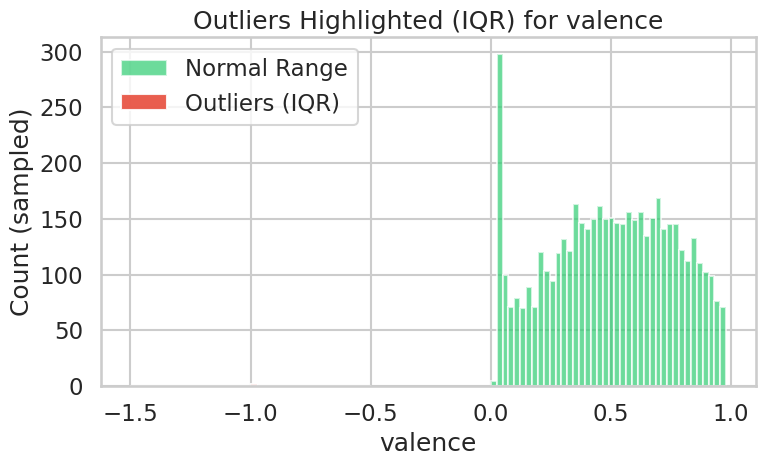

Saved: /mnt/data/outlier_analysis_outputs/boxplot_valence.png


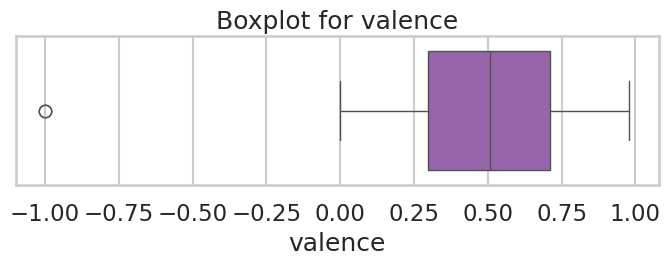

Saved: /mnt/data/outlier_analysis_outputs/violin_valence.png


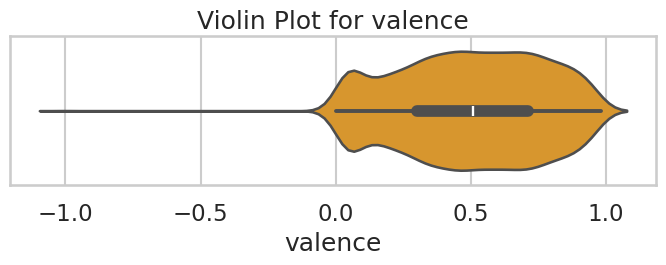

Saved: /mnt/data/outlier_analysis_outputs/before_after_valence.png


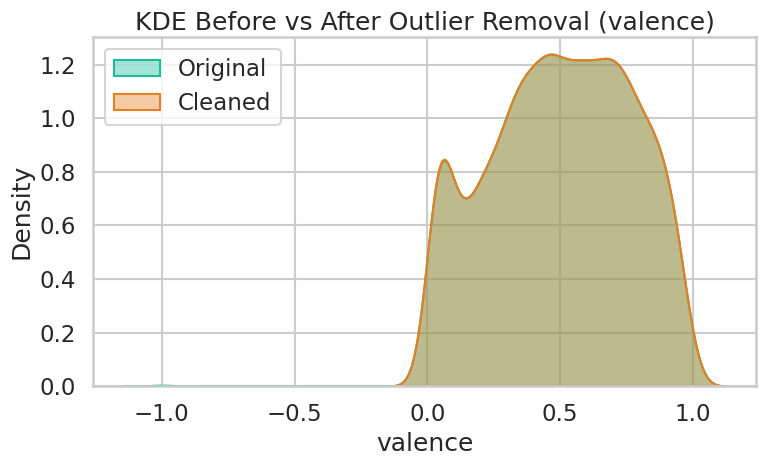


🎉 FAST OUTLIER ANALYSIS COMPLETE!
Images saved to: /mnt/data/outlier_analysis_outputs


In [10]:
# ===============================================================
#  OUTLIER PLOTS FOR EACH VARIABLE
# ===============================================================

PLOT_SAMPLE = 5000   # sample size for speed
HIST_BINS = 40       # number of bins

for col in num_cols:
    s_full = num_df[col].dropna()
    n_total = len(s_full)
    if n_total == 0:
        print(f"Skipping {col}, empty column.")
        continue

    # Sampling for fast plotting
    if n_total > PLOT_SAMPLE:
        s_sample = s_full.sample(PLOT_SAMPLE, random_state=42)
    else:
        s_sample = s_full

    print(f"Plotting {col} (sample size = {len(s_sample)})")

    # ---------------- Histogram + KDE (sampled) ----------------
    try:
        plt.figure(figsize=(8,5))
        sns.histplot(s_sample, bins=HIST_BINS, kde=True, color="#1f77b4")
        plt.title(f"Histogram + KDE for {col}")
        plt.xlabel(col)
        plt.ylabel("Count")
        savefig(f"hist_kde_{col}")
    except Exception as e:
        plt.close()
        print("Error in hist+kde:", e)

    # ---------------- Compute IQR bounds ----------------
    Q1 = s_full.quantile(0.25)
    Q3 = s_full.quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    # ---------------- Outlier-highlighted histogram ----------------
    try:
        in_range = s_sample[(s_sample >= lower) & (s_sample <= upper)]
        out_range = s_sample[(s_sample < lower) | (s_sample > upper)]

        plt.figure(figsize=(8,5))
        plt.hist(in_range, bins=HIST_BINS, alpha=0.7, label="Normal Range", color="#2ecc71")
        if len(out_range) > 0:
            plt.hist(out_range, bins=HIST_BINS, alpha=0.9, label="Outliers (IQR)", color="#e74c3c")
        plt.title(f"Outliers Highlighted (IQR) for {col}")
        plt.xlabel(col)
        plt.ylabel("Count (sampled)")
        plt.legend()
        savefig(f"outlier_hist_{col}")
    except Exception as e:
        plt.close()
        print("Error in outlier histogram:", e)

    # ---------------- Boxplot ----------------
    try:
        plt.figure(figsize=(7,3))
        sns.boxplot(x=s_sample, color="#9b59b6")
        plt.title(f"Boxplot for {col}")
        savefig(f"boxplot_{col}")
    except Exception as e:
        plt.close()
        print("Error in boxplot:", e)

    # ---------------- Violin plot ----------------
    try:
        plt.figure(figsize=(7,3))
        sns.violinplot(x=s_sample, color="#f39c12")
        plt.title(f"Violin Plot for {col}")
        savefig(f"violin_{col}")
    except Exception as e:
        plt.close()
        print("Error in violin:", e)

    # ---------------- Before vs After KDE ----------------
    try:
        cleaned_sample = s_sample[(s_sample >= lower) & (s_sample <= upper)]
        plt.figure(figsize=(8,5))
        sns.kdeplot(s_sample, fill=True, alpha=0.4, label="Original", color="#1abc9c")
        if len(cleaned_sample) > 0:
            sns.kdeplot(cleaned_sample, fill=True, alpha=0.4, label="Cleaned", color="#e67e22")
        plt.title(f"KDE Before vs After Outlier Removal ({col})")
        plt.xlabel(col)
        plt.legend()
        savefig(f"before_after_{col}")
    except Exception as e:
        plt.close()
        print("Error in KDE before/after:", e)

print("\n FAST OUTLIER ANALYSIS COMPLETE!")
print("Images saved to:", OUT)
